In [ ]:
# LOADING THE DATA AND EDA 

In [ ]:
import numpy as np
import pandas as pd 
import lightgbm as lgb
import scipy as sp
import sklearn as sk
import seaborn as sb
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import matplotlib
import matplotlib.ticker as mticker
import matplotlib.dates as mdates
import xgboost as xgb
from xgboost import plot_importance
from xgboost import XGBClassifier
from sklearn import metrics
from sklearn.metrics import mean_squared_error
from sklearn.metrics import accuracy_score
from sklearn.model_selection import GridSearchCV
import sklearn.datasets
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import ParameterGrid
from sklearn.metrics import roc_auc_score
from sklearn.metrics import accuracy_score
from sklearn.ensemble import RandomForestClassifier
from functools import partial
import statsmodels.api as sm
from sklearn.linear_model import LinearRegression
import statsmodels.formula.api as smm
import shap
import os 
import parfit as pf
from parfit import bestFit # Necessary if you wish to use bestFit
# Necessary if you wish to run each step sequentially
from parfit.fit import *
from parfit.score import *
from parfit.plot import *
from parfit.crossval import *

%matplotlib inline

In [109]:
#LOOK AND SEE WHAT THE WORKIND DRIVE IS

os.getcwd()

'C:\\Users\\acdav\\OneDrive\\Documentos\\OneDrive\\Alexjandro\\School\\Regis (2)\\MSDS 696\\data\\Project2data'

In [6]:
#CHANGE THE WORKING DRIVE TO THE ONE I WILL BE USING FOR THE ANALYSIS AND WHERE THE DATSET IS

os.chdir('C:\\Users\\acdav\\OneDrive\\Documentos\\OneDrive\\Alexjandro\\School\\Regis (2)\\MSDS 696\\data\\Project2data')

In [7]:
#CHECK TO MAKE SURE THAT THE WORKING DIRECTORY IS WHERE I NEED IT TO BE

os.getcwd()

'C:\\Users\\acdav\\OneDrive\\Documentos\\OneDrive\\Alexjandro\\School\\Regis (2)\\MSDS 696\\data\\Project2data'

In [8]:
#CREATE THE DATAFRAME WITH THE DATASET TAHT I WILL BE USING

accident = pd.read_excel('ACCIDENT.xlsx')

In [9]:
#PRINT THE DATASET AND MAKE SURE THAT IT CONTAINS WHAT I WANT TO WORK WITH 

accident.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33654 entries, 0 to 33653
Data columns (total 52 columns):
STATE         33654 non-null int64
ST_CASE       33654 non-null int64
VE_TOTAL      33654 non-null int64
VE_FORMS      33654 non-null int64
PVH_INVL      33654 non-null int64
PEDS          33654 non-null int64
PERNOTMVIT    33654 non-null int64
PERMVIT       33654 non-null int64
PERSONS       33654 non-null int64
COUNTY        33654 non-null int64
CITY          33654 non-null int64
DAY           33654 non-null int64
MONTH         33654 non-null int64
YEAR          33654 non-null int64
DAY_WEEK      33654 non-null int64
HOUR          33654 non-null int64
MINUTE        33654 non-null int64
NHS           33654 non-null int64
RUR_URB       33654 non-null int64
FUNC_SYS      33654 non-null int64
RD_OWNER      33654 non-null int64
ROUTE         33654 non-null int64
TWAY_ID       33654 non-null object
TWAY_ID2      9190 non-null object
MILEPT        33654 non-null int64
LATITUDE      3

In [10]:
#COMPLETE FURTHER EDA AND LOOK AT THE COLUMNS AND OBSERVATIONS THE DF HAS, THEN MAKE SURE THAT THE 
#COLUMNS ARE POPULATED AND HAVE THE CORRECT OBSERVATIONS BY LOOKING AT THE FIRST 5 ROWS OR SO

print('dimensions:', accident.shape)
accident.head()

dimensions: (33654, 52)


,STATE,ST_CASE,VE_TOTAL,VE_FORMS,PVH_INVL,PEDS,PERNOTMVIT,PERMVIT,PERSONS,COUNTY,...,NOT_MIN,ARR_HOUR,ARR_MIN,HOSP_HR,HOSP_MN,CF1,CF2,CF3,FATALS,DRUNK_DR
0,1,10001,2,1,1,0,0,1,1,121,...,99,6,15,88,88,0,0,0,1,0
1,1,10002,1,1,0,0,0,2,2,127,...,99,0,59,88,88,20,0,0,2,0
2,1,10003,2,2,0,0,0,2,2,21,...,99,23,10,99,99,0,0,0,1,0
3,1,10004,1,1,0,0,0,2,2,3,...,99,13,14,88,88,0,0,0,1,0
4,1,10005,2,2,0,0,0,2,2,73,...,99,7,28,88,88,0,0,0,1,0


In [11]:
#LOOKING AT THE SUMMARY STATISTICS OF THE DATA SET, THIS CAN HELP WITH DISTRIBUTIONS AND UNDERSTANDING OR TRENDS

accident.describe()

,STATE,ST_CASE,VE_TOTAL,VE_FORMS,PVH_INVL,PEDS,PERNOTMVIT,PERMVIT,PERSONS,COUNTY,...,NOT_MIN,ARR_HOUR,ARR_MIN,HOSP_HR,HOSP_MN,CF1,CF2,CF3,FATALS,DRUNK_DR
count,33654.000000,33654.000000,33654.000000,33654.000000,33654.000000,33654.000000,33654.000000,33654.000000,33654.000000,33654.000000,...,33654.000000,33654.000000,33654.000000,33654.000000,33654.000000,33654.000000,33654.000000,33654.000000,33654.000000,33654.000000
mean,27.221727,272959.565074,1.580258,1.541332,0.038926,0.231830,0.243359,2.241517,2.253046,91.763238,...,67.332442,59.749510,67.141915,73.812979,77.751798,2.151958,1.069204,0.957717,1.086349,0.256849
std,16.397000,163875.616648,0.823660,0.776784,0.302969,0.476945,0.506895,1.804314,1.809363,97.588969,...,36.303949,42.862942,36.368152,35.317922,29.735309,10.610611,9.760143,9.647763,0.359572,0.454830
min,1.000000,10001.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
25%,12.000000,121958.250000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,31.000000,...,33.000000,15.000000,33.000000,88.000000,88.000000,0.000000,0.000000,0.000000,1.000000,0.000000
50%,26.000000,260901.500000,1.000000,1.000000,0.000000,0.000000,0.000000,2.000000,2.000000,71.000000,...,98.000000,99.000000,98.000000,88.000000,88.000000,0.000000,0.000000,0.000000,1.000000,0.000000
75%,42.000000,420571.750000,2.000000,2.000000,0.000000,0.000000,0.000000,3.000000,3.000000,115.000000,...,99.000000,99.000000,99.000000,99.000000,99.000000,0.000000,0.000000,0.000000,1.000000,0.000000
max,56.000000,560101.000000,27.000000,27.000000,20.000000,10.000000,10.000000,47.000000,47.000000,999.000000,...,99.000000,99.000000,99.000000,99.000000,99.000000,99.000000,99.000000,99.000000,20.000000,4.000000


In [12]:
#CREATE A BINARY VARAIBLE FOR THE CONTINUOUS OUTCOME VARAIBLE FOR THE ANALYSIS 
#THEN LOOK AT THE FIRST FEW ROWS OF THE DATASET WITH THE NEW VARIABLE TO ENSURE IT WAS CREATED CORRECTLY

accident["MultiFatal"] = (accident["FATALS"] > accident["FATALS"].median()).astype(int)
accident.head()

,STATE,ST_CASE,VE_TOTAL,VE_FORMS,PVH_INVL,PEDS,PERNOTMVIT,PERMVIT,PERSONS,COUNTY,...,ARR_HOUR,ARR_MIN,HOSP_HR,HOSP_MN,CF1,CF2,CF3,FATALS,DRUNK_DR,MultiFatal
0,1,10001,2,1,1,0,0,1,1,121,...,6,15,88,88,0,0,0,1,0,0
1,1,10002,1,1,0,0,0,2,2,127,...,0,59,88,88,20,0,0,2,0,1
2,1,10003,2,2,0,0,0,2,2,21,...,23,10,99,99,0,0,0,1,0,0
3,1,10004,1,1,0,0,0,2,2,3,...,13,14,88,88,0,0,0,1,0,0
4,1,10005,2,2,0,0,0,2,2,73,...,7,28,88,88,0,0,0,1,0,0


In [13]:
#LOOK AT SOME INITIAL STATS BEFORE GOING TOO FAR
accident["MultiFatal"].value_counts()

0    31269
1     2385
Name: MultiFatal, dtype: int64

In [ ]:
#LOOKING AT THE DIMENSIONS AND THE OBSERVATION AMOUNTS FOR THE DF WITH THE NEW COLUMN CREATED
#LOOK FOR THE DATA TYPES AS WELL TO MAKE SURE THEY ARE ALL COMPATIBLE, AND WE SEE THAT NOT ALL OF THEM ARE
#SOME CONVERSIONS WILL NEED TO BE COMPLETED AND SOME VARIABLES WILL NEED TO BE DROPPED
print('dimensions:', accident.shape)

In [18]:
#THEN WE LOOK FOR ANY PHYSICALLY MISSING VARIABLES 

accident.isnull().sum()

STATE             0
ST_CASE           0
VE_TOTAL          0
VE_FORMS          0
PVH_INVL          0
PEDS              0
PERNOTMVIT        0
PERMVIT           0
PERSONS           0
COUNTY            0
CITY              0
DAY               0
MONTH             0
YEAR              0
DAY_WEEK          0
HOUR              0
MINUTE            0
NHS               0
RUR_URB           0
FUNC_SYS          0
RD_OWNER          0
ROUTE             0
TWAY_ID           0
TWAY_ID2      24464
MILEPT            0
LATITUDE          0
LONGITUD          0
SP_JUR            0
HARM_EV           0
MAN_COLL          0
RELJCT1           0
RELJCT2           0
TYP_INT           0
WRK_ZONE          0
REL_ROAD          0
LGT_COND          0
WEATHER1          0
WEATHER2          0
WEATHER           0
SCH_BUS           0
RAIL              0
NOT_HOUR          0
NOT_MIN           0
ARR_HOUR          0
ARR_MIN           0
HOSP_HR           0
HOSP_MN           0
CF1               0
CF2               0
CF3               0


In [19]:
accident.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33654 entries, 0 to 33653
Data columns (total 53 columns):
STATE         33654 non-null int64
ST_CASE       33654 non-null int64
VE_TOTAL      33654 non-null int64
VE_FORMS      33654 non-null int64
PVH_INVL      33654 non-null int64
PEDS          33654 non-null int64
PERNOTMVIT    33654 non-null int64
PERMVIT       33654 non-null int64
PERSONS       33654 non-null int64
COUNTY        33654 non-null int64
CITY          33654 non-null int64
DAY           33654 non-null int64
MONTH         33654 non-null int64
YEAR          33654 non-null int64
DAY_WEEK      33654 non-null int64
HOUR          33654 non-null int64
MINUTE        33654 non-null int64
NHS           33654 non-null int64
RUR_URB       33654 non-null int64
FUNC_SYS      33654 non-null int64
RD_OWNER      33654 non-null int64
ROUTE         33654 non-null int64
TWAY_ID       33654 non-null object
TWAY_ID2      9190 non-null object
MILEPT        33654 non-null int64
LATITUDE      3

In [20]:
#WE WILL CHANGE THE DATATYPE OF THE OUTCOME VARAIBLES TO A INT64 LIKE THE REST OF THE VARAIBLES INCLUDED
#THEN WE PRINT TO MAKE SURE IT HAPPENED

accident['MultiFatal'] = (accident['MultiFatal']).astype(np.int64)
print(accident.MultiFatal.dtypes)

int64


In [21]:
#WE SEE THAT ONE OF THE VARIABLES ABOVE IS PHYSICALLY MISSING OBSERVATIONS AND WILL MOST LIKELY BE DELETED
#WE WILL LOOK FOR PHYSICALLY MISSING OBSERVATIONS AS WELL FOR THE REST OF THE DF 

print (accident.isnull().sum())

STATE             0
ST_CASE           0
VE_TOTAL          0
VE_FORMS          0
PVH_INVL          0
PEDS              0
PERNOTMVIT        0
PERMVIT           0
PERSONS           0
COUNTY            0
CITY              0
DAY               0
MONTH             0
YEAR              0
DAY_WEEK          0
HOUR              0
MINUTE            0
NHS               0
RUR_URB           0
FUNC_SYS          0
RD_OWNER          0
ROUTE             0
TWAY_ID           0
TWAY_ID2      24464
MILEPT            0
LATITUDE          0
LONGITUD          0
SP_JUR            0
HARM_EV           0
MAN_COLL          0
RELJCT1           0
RELJCT2           0
TYP_INT           0
WRK_ZONE          0
REL_ROAD          0
LGT_COND          0
WEATHER1          0
WEATHER2          0
WEATHER           0
SCH_BUS           0
RAIL              0
NOT_HOUR          0
NOT_MIN           0
ARR_HOUR          0
ARR_MIN           0
HOSP_HR           0
HOSP_MN           0
CF1               0
CF2               0
CF3               0


In [56]:
accident22 = accident.drop(['STATE','ST_CASE','DAY','VE_FORMS','PEDS','PERSONS','CITY','YEAR','MILEPT','TWAY_ID','CF3',
                           'TWAY_ID2','HOUR','LATITUDE','LONGITUD','NOT_HOUR','NOT_MIN','ARR_HOUR','ARR_MIN','CF1','CF2',
                           'HARM_EV','COUNTY','MINUTE','RELJCT1','WEATHER1','WEATHER2','HOSP_HR','HOSP_MN','RAIL'],axis=1)

In [66]:
accident22.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33654 entries, 0 to 33653
Data columns (total 23 columns):
VE_TOTAL      33654 non-null int64
PVH_INVL      33654 non-null int64
PERNOTMVIT    33654 non-null int64
PERMVIT       33654 non-null int64
MONTH         33654 non-null int64
DAY_WEEK      33654 non-null int64
NHS           33654 non-null int64
RUR_URB       33654 non-null int64
FUNC_SYS      33654 non-null int64
RD_OWNER      33654 non-null int64
ROUTE         33654 non-null int64
SP_JUR        33654 non-null int64
MAN_COLL      33654 non-null int64
RELJCT2       33654 non-null int64
TYP_INT       33654 non-null int64
WRK_ZONE      33654 non-null int64
REL_ROAD      33654 non-null int64
LGT_COND      33654 non-null int64
WEATHER       33654 non-null int64
SCH_BUS       33654 non-null int64
FATALS        33654 non-null int64
DRUNK_DR      33654 non-null int64
MultiFatal    33654 non-null int64
dtypes: int64(23)
memory usage: 5.9 MB


In [75]:
corr = accident22.corr(method = 'spearman')

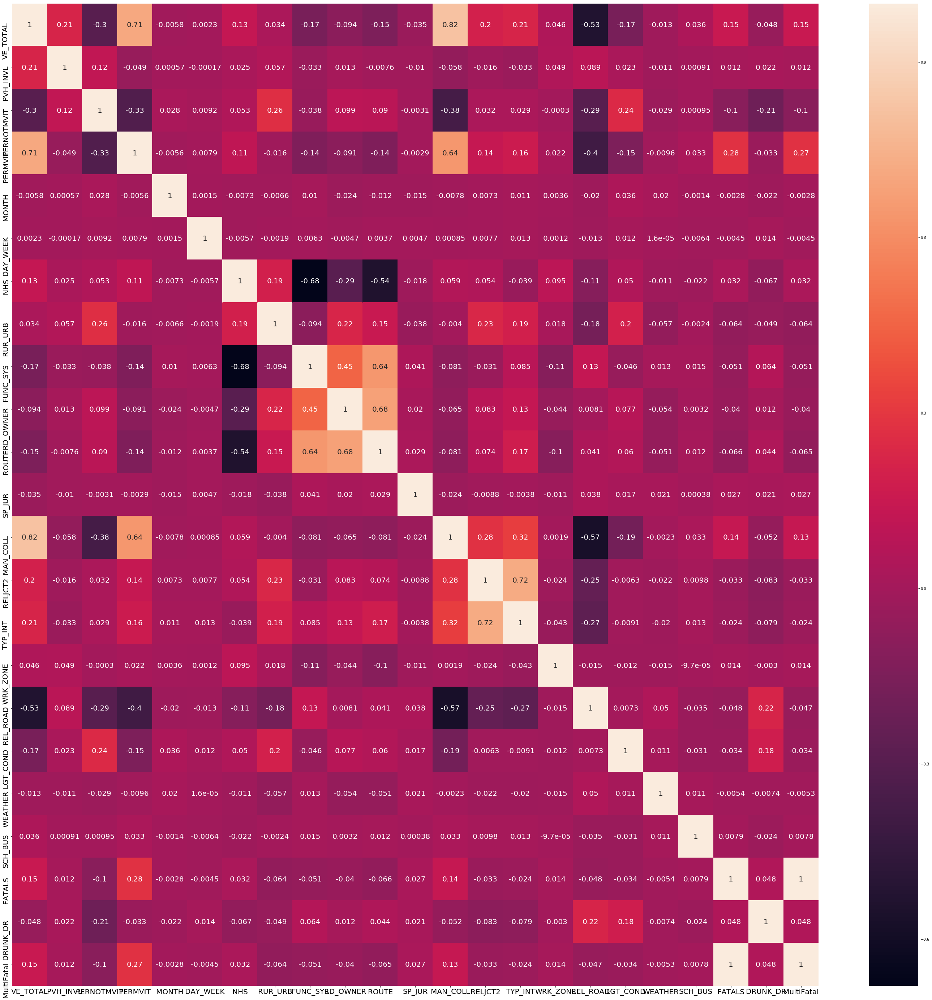

In [76]:
fig, ax = plt.subplots(figsize=(50,50))
sb.heatmap(corr, xticklabels = corr.columns, yticklabels = corr.columns, annot = True, annot_kws={"size": 20}, ax=ax)
ax.tick_params(axis='both', which='major', labelsize=20)
ax.tick_params(axis='both', which='minor', labelsize=20)
#vmin=-1, vmax=1, center=0,
 #   cmap=sb.diverging_palette(20, 220, n=200, square=True)

In [65]:
from sklearn.linear_model import LinearRegression
import statsmodels.formula.api as sm

#Code for VIF Calculation

#Writing a function to calculate the VIF values for numeric datasets

def vif_cal(input_data, dependent_col):
    x_vars=input_data.drop([dependent_col], axis=1)
    xvar_names=x_vars.columns
    for i in range(0,xvar_names.shape[0]):
        y=x_vars[xvar_names[i]] 
        x=x_vars[xvar_names.drop(xvar_names[i])]
        rsq=sm.ols(formula="y~x", data=x_vars).fit().rsquared  
        vif=round(1/(1-rsq),2)
        print (xvar_names[i], " VIF = " , vif)

In [70]:
vif_cal(input_data=accident22, dependent_col="MultiFatal")

VE_TOTAL  VIF =  2.21
PVH_INVL  VIF =  1.32
PERNOTMVIT  VIF =  1.23
PERMVIT  VIF =  1.9
MONTH  VIF =  1.0
DAY_WEEK  VIF =  1.0
NHS  VIF =  2.92
RUR_URB  VIF =  3.47
FUNC_SYS  VIF =  3.69
RD_OWNER  VIF =  1.46
ROUTE  VIF =  1.64
SP_JUR  VIF =  1.03
MAN_COLL  VIF =  1.16
RELJCT2  VIF =  2.9
TYP_INT  VIF =  3.14
WRK_ZONE  VIF =  1.01
REL_ROAD  VIF =  2.12
LGT_COND  VIF =  1.13
WEATHER  VIF =  1.05
SCH_BUS  VIF =  1.01
FATALS  VIF =  1.11
DRUNK_DR  VIF =  1.08


In [71]:
#DROP MULTICOLLINEAR FATALS FROM THE DATASET
accident3 = accident22.drop(['FATALS'],axis=1)

In [72]:
#NOW EVERYTHING ELSE WILL STAY EVEN THE FAIRLY CORRELATED VALUES DUE TO BEING RULED OUT FROM THE VIF
accident3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33654 entries, 0 to 33653
Data columns (total 22 columns):
VE_TOTAL      33654 non-null int64
PVH_INVL      33654 non-null int64
PERNOTMVIT    33654 non-null int64
PERMVIT       33654 non-null int64
MONTH         33654 non-null int64
DAY_WEEK      33654 non-null int64
NHS           33654 non-null int64
RUR_URB       33654 non-null int64
FUNC_SYS      33654 non-null int64
RD_OWNER      33654 non-null int64
ROUTE         33654 non-null int64
SP_JUR        33654 non-null int64
MAN_COLL      33654 non-null int64
RELJCT2       33654 non-null int64
TYP_INT       33654 non-null int64
WRK_ZONE      33654 non-null int64
REL_ROAD      33654 non-null int64
LGT_COND      33654 non-null int64
WEATHER       33654 non-null int64
SCH_BUS       33654 non-null int64
DRUNK_DR      33654 non-null int64
MultiFatal    33654 non-null int64
dtypes: int64(22)
memory usage: 5.6 MB


In [77]:
#WE WANT TO CHECK FOR ANY PHYSICALLY MISSING VARAIBLES IN ANY COLUMN 

print (accident3.isnull().sum())

VE_TOTAL      0
PVH_INVL      0
PERNOTMVIT    0
PERMVIT       0
MONTH         0
DAY_WEEK      0
NHS           0
RUR_URB       0
FUNC_SYS      0
RD_OWNER      0
ROUTE         0
SP_JUR        0
MAN_COLL      0
RELJCT2       0
TYP_INT       0
WRK_ZONE      0
REL_ROAD      0
LGT_COND      0
WEATHER       0
SCH_BUS       0
DRUNK_DR      0
MultiFatal    0
dtype: int64


In [78]:
#WE NEED TO CREATE THE DUMMIES OF ALL OF THE NUMERIC CATEGORICAL COLUMNS THAT ARE NOT ORDINAL
#WE WILL CREATE ANOTHER DATA FRAME TO SEPARATE THE NEW COLUMNS FROM THE ORIGINALS AS TO NOT
#OVERWRITE OUR STARTING DATA LIKE WE DID WITH THE 2ND ITERATION OF THE DATASET

accident4 = accident3.copy()
accident5 = pd.get_dummies(accident4, columns=['DAY_WEEK','ROUTE','RUR_URB','FUNC_SYS',
                                               'RD_OWNER','SP_JUR','MAN_COLL','RELJCT2',
                                               'MONTH','TYP_INT','REL_ROAD','WRK_ZONE',
                                               'LGT_COND','WEATHER'], prefix=['DAY_WEEK',
                                               'ROUTE','RUR_URB','FUNC_SYS',
                                               'RD_OWNER','SP_JUR','MAN_COLL','RELJCT2',
                                               'MONTH','TYP_INT','REL_ROAD','WRK_ZONE',
                                               'LGT_COND','WEATHER'])

#WE THEN LOOK AT THE HEADS AND THE INFO OF THE DATA TO SEE IF THEY WERE ALL CREATED AND IF EVERYTHING
#THAT NEEDED TO BE CREATED WAS

print(accident5.head())
print(accident5.tail())
accident5.info()

   VE_TOTAL  PVH_INVL  PERNOTMVIT  PERMVIT  NHS  SCH_BUS  DRUNK_DR  \
0         2         1           0        1    1        0         0   
1         1         0           0        2    1        0         0   
2         2         0           0        2    1        0         0   
3         1         0           0        2    1        0         0   
4         2         0           0        2    1        0         0   

   MultiFatal  DAY_WEEK_1  DAY_WEEK_2     ...      WEATHER_4  WEATHER_5  \
0           0           0           0     ...              0          0   
1           1           0           1     ...              0          0   
2           0           0           1     ...              0          0   
3           0           0           0     ...              0          0   
4           0           0           0     ...              0          0   

   WEATHER_6  WEATHER_7  WEATHER_8  WEATHER_10  WEATHER_11  WEATHER_12  \
0          0          0          0           0        

In [79]:
#AGAIN WE SEE THAT THERE ARE NO PHYSICALLY MISSING VARIABLES AFTER THE NEW DATASET IS MADE EITHER

print (accident5.isnull().sum())

VE_TOTAL       0
PVH_INVL       0
PERNOTMVIT     0
PERMVIT        0
NHS            0
SCH_BUS        0
DRUNK_DR       0
MultiFatal     0
DAY_WEEK_1     0
DAY_WEEK_2     0
DAY_WEEK_3     0
DAY_WEEK_4     0
DAY_WEEK_5     0
DAY_WEEK_6     0
DAY_WEEK_7     0
ROUTE_1        0
ROUTE_2        0
ROUTE_3        0
ROUTE_4        0
ROUTE_5        0
ROUTE_6        0
ROUTE_7        0
ROUTE_8        0
ROUTE_9        0
RUR_URB_1      0
RUR_URB_2      0
RUR_URB_6      0
RUR_URB_8      0
RUR_URB_9      0
FUNC_SYS_1     0
              ..
REL_ROAD_12    0
REL_ROAD_98    0
REL_ROAD_99    0
WRK_ZONE_0     0
WRK_ZONE_1     0
WRK_ZONE_2     0
WRK_ZONE_3     0
WRK_ZONE_4     0
LGT_COND_1     0
LGT_COND_2     0
LGT_COND_3     0
LGT_COND_4     0
LGT_COND_5     0
LGT_COND_6     0
LGT_COND_7     0
LGT_COND_8     0
LGT_COND_9     0
WEATHER_1      0
WEATHER_2      0
WEATHER_3      0
WEATHER_4      0
WEATHER_5      0
WEATHER_6      0
WEATHER_7      0
WEATHER_8      0
WEATHER_10     0
WEATHER_11     0
WEATHER_12    

In [80]:
#THIS HELPS TO IDENTIFY ALL OF THE PRESENT NEW DUMMIES CREATED 
#AND ALLOWS FOR IDENTIFICATION OF THE UNKNOWN AND NOT REPORTED COLUMNS
#COLUMNS 8,9,98,AND 99 ARE THE ONES THAT NEED TO BE DROPPED AND WE KNOW THIS
#FROM THE USERS MANUAL OF THE DATA THAT TELLS US THESE VALUES ARE MISSING 

filter_col = [col for col in accident5 if col.startswith('LGT_COND')]
filter_col

['LGT_COND_1',
 'LGT_COND_2',
 'LGT_COND_3',
 'LGT_COND_4',
 'LGT_COND_5',
 'LGT_COND_6',
 'LGT_COND_7',
 'LGT_COND_8',
 'LGT_COND_9']

In [83]:
#WE WILL NOW DROP ALL OF THE COLUMNS THAT CONTAIN THE MISSING VALUES
#THIS ALLOWS FOR THE MISSING VARIABLES TO SYSTEMATICALLY BE TAKEN OUT OF THE EQUATION 
#WE WILL CREATE A 4TH DF TO HOUSE THE FINAL VARIABLES FOR THE ANALYSIS

accident6 = accident5.drop(['WEATHER_98','WEATHER_99','ROUTE_9','RUR_URB_8','RUR_URB_9','RUR_URB_6',
               'FUNC_SYS_98','FUNC_SYS_99','RD_OWNER_96','RD_OWNER_98','RD_OWNER_99','SP_JUR_9',
               'MAN_COLL_98','MAN_COLL_99','RELJCT2_98','RELJCT2_99','TYP_INT_98','TYP_INT_99',
               'REL_ROAD_98','REL_ROAD_99','LGT_COND_8','LGT_COND_9'],axis=1)


In [84]:
#LOOK AT THE SUMMARY STATS, INFO, DATA TYPES, AND MISSING VARIABLES/OBSERVATIONS AGAIN TO MAKE SURE THE DF IS 
#READY FOR TO BUILD THE MODELS AND MOVE FORWARD WITH THE ANALYSIS 

accident6.describe()

,VE_TOTAL,PVH_INVL,PERNOTMVIT,PERMVIT,NHS,SCH_BUS,DRUNK_DR,MultiFatal,DAY_WEEK_1,DAY_WEEK_2,...,WEATHER_2,WEATHER_3,WEATHER_4,WEATHER_5,WEATHER_6,WEATHER_7,WEATHER_8,WEATHER_10,WEATHER_11,WEATHER_12
count,33654.000000,33654.000000,33654.000000,33654.000000,33654.000000,33654.000000,33654.000000,33654.000000,33654.000000,33654.000000,...,33654.000000,33654.000000,33654.000000,33654.000000,33654.000000,33654.000000,33654.000000,33654.00000,33654.000000,33654.000000
mean,1.580258,0.038926,0.243359,2.241517,0.550841,0.003061,0.256849,0.070868,0.150146,0.135615,...,0.081862,0.001902,0.011618,0.010816,0.001575,0.000297,0.001189,0.14548,0.000951,0.000743
std,0.823660,0.302969,0.506895,1.804314,1.233051,0.055238,0.454830,0.256608,0.357219,0.342385,...,0.274159,0.043568,0.107162,0.103437,0.039654,0.017235,0.034456,0.35259,0.030822,0.027246
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000
25%,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000
50%,1.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000
75%,2.000000,0.000000,0.000000,3.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000
max,27.000000,20.000000,10.000000,47.000000,9.000000,1.000000,4.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000


In [85]:
#LOOK AT THE SUMMARY STATS, INFO, DATA TYPES, AND MISSING VARIABLES/OBSERVATIONS AGAIN TO MAKE SURE THE DF IS 
#READY FOR TO BUILD THE MODELS AND MOVE FORWARD WITH THE ANALYSIS 

accident6.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33654 entries, 0 to 33653
Columns: 137 entries, VE_TOTAL to WEATHER_12
dtypes: int64(8), uint8(129)
memory usage: 6.2 MB


In [86]:
#AGAIN WE SEE THAT THERE ARE NO PHYSICALLY MISSING VARIABLES AFTER THE NEW DATASET IS MADE EITHER

print (accident6.isnull().sum())
print (accident6.isnull().values.any())

VE_TOTAL       0
PVH_INVL       0
PERNOTMVIT     0
PERMVIT        0
NHS            0
SCH_BUS        0
DRUNK_DR       0
MultiFatal     0
DAY_WEEK_1     0
DAY_WEEK_2     0
DAY_WEEK_3     0
DAY_WEEK_4     0
DAY_WEEK_5     0
DAY_WEEK_6     0
DAY_WEEK_7     0
ROUTE_1        0
ROUTE_2        0
ROUTE_3        0
ROUTE_4        0
ROUTE_5        0
ROUTE_6        0
ROUTE_7        0
ROUTE_8        0
RUR_URB_1      0
RUR_URB_2      0
FUNC_SYS_1     0
FUNC_SYS_2     0
FUNC_SYS_3     0
FUNC_SYS_4     0
FUNC_SYS_5     0
              ..
REL_ROAD_5     0
REL_ROAD_6     0
REL_ROAD_7     0
REL_ROAD_8     0
REL_ROAD_10    0
REL_ROAD_11    0
REL_ROAD_12    0
WRK_ZONE_0     0
WRK_ZONE_1     0
WRK_ZONE_2     0
WRK_ZONE_3     0
WRK_ZONE_4     0
LGT_COND_1     0
LGT_COND_2     0
LGT_COND_3     0
LGT_COND_4     0
LGT_COND_5     0
LGT_COND_6     0
LGT_COND_7     0
WEATHER_1      0
WEATHER_2      0
WEATHER_3      0
WEATHER_4      0
WEATHER_5      0
WEATHER_6      0
WEATHER_7      0
WEATHER_8      0
WEATHER_10    

In [98]:
g = accident6.corr(method = 'spearman')

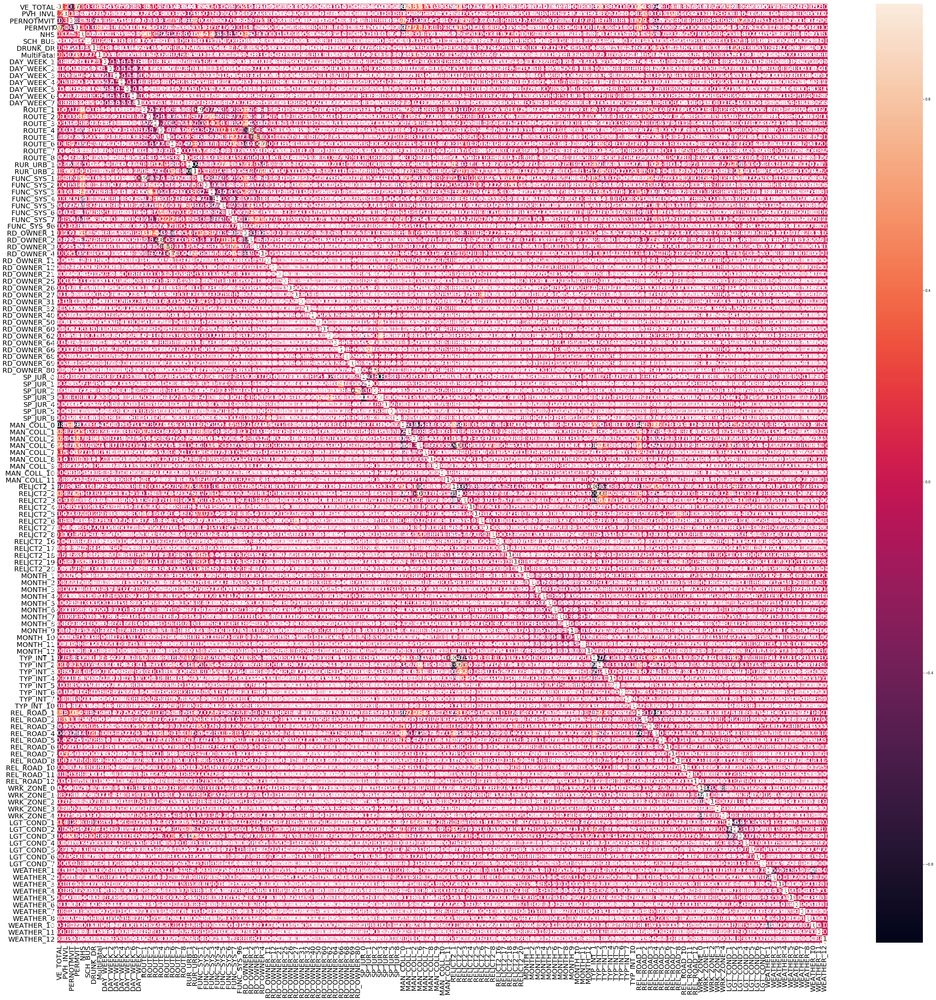

In [100]:
fig, ax = plt.subplots(figsize=(50,50))
sb.heatmap(g, xticklabels = g.columns, yticklabels = g.columns, annot = True, annot_kws={"size": 20}, ax=ax)
ax.tick_params(axis='both', which='major', labelsize=20)
ax.tick_params(axis='both', which='minor', labelsize=20)

In [87]:
#CREATE ANOTHER DATASET WITHOUT THE OUTCOME VARAIBLES TO CREATE THE EXPLANATORY VALUES FOR THE TRAIN AND TEST DATASETS

accidentX = accident6.drop('MultiFatal',axis=1)

In [88]:
#CHECK TO MAKE SURE THE OUTCOME VARAIBLE IS GONE AND WE ARE ONLY LEFT WITH THE EXPLANATORY VARAIBLES

accidentX.describe()

,VE_TOTAL,PVH_INVL,PERNOTMVIT,PERMVIT,NHS,SCH_BUS,DRUNK_DR,DAY_WEEK_1,DAY_WEEK_2,DAY_WEEK_3,...,WEATHER_2,WEATHER_3,WEATHER_4,WEATHER_5,WEATHER_6,WEATHER_7,WEATHER_8,WEATHER_10,WEATHER_11,WEATHER_12
count,33654.000000,33654.000000,33654.000000,33654.000000,33654.000000,33654.000000,33654.000000,33654.000000,33654.000000,33654.000000,...,33654.000000,33654.000000,33654.000000,33654.000000,33654.000000,33654.000000,33654.000000,33654.00000,33654.000000,33654.000000
mean,1.580258,0.038926,0.243359,2.241517,0.550841,0.003061,0.256849,0.150146,0.135615,0.127474,...,0.081862,0.001902,0.011618,0.010816,0.001575,0.000297,0.001189,0.14548,0.000951,0.000743
std,0.823660,0.302969,0.506895,1.804314,1.233051,0.055238,0.454830,0.357219,0.342385,0.333508,...,0.274159,0.043568,0.107162,0.103437,0.039654,0.017235,0.034456,0.35259,0.030822,0.027246
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000
25%,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000
50%,1.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000
75%,2.000000,0.000000,0.000000,3.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000
max,27.000000,20.000000,10.000000,47.000000,9.000000,1.000000,4.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000


In [ ]:
# CREATING THE TEST AND TRAINING SET FOR BOTH MODELS

In [92]:
#CREATE THE SEPARATED ANALYSIS SPECIFIC DATASETS SO THAT THE OUTCOME VARIABLE IS ALONE AND READY FOR THE ANALYSIS

B, a = accidentX.iloc[:,:],accident6.iloc[:,7]

In [95]:
#CREATE A DMATRIX FOR THE THE CROSS-VALIDATION METHOD LATER THIS IS SO THAT THE XGBOOST CV METHOD CAN READ THAT DATA 

data_dmatrix = xgb.DMatrix(data=B,label=a)

D:\Anaconda3\lib\site-packages\xgboost\core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
D:\Anaconda3\lib\site-packages\xgboost\core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


In [110]:
#CREATE A TRAIN, VALIDATION, AND TEST SET DUE TO HAVING A REAL-WOLD PROBLEM THAT WOULD NOT DO WELL IN A CV SITUATION.
B_train, B_test, a_train, a_test = train_test_split(B, a, test_size=0.2, random_state=968)

B_train, B_val, a_train, a_val = train_test_split(B_train, a_train, test_size=0.25, random_state=987)

-------------FITTING MODELS-------------


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   6 | elapsed:   24.6s remaining:   49.3s
[Parallel(n_jobs=-1)]: Done   3 out of   6 | elapsed:   24.6s remaining:   24.6s
[Parallel(n_jobs=-1)]: Done   4 out of   6 | elapsed:   24.6s remaining:   12.3s
[Parallel(n_jobs=-1)]: Done   6 out of   6 | elapsed:   24.8s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done   6 out of   6 | elapsed:   24.8s finished


-------------SCORING MODELS-------------


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   6 out of   6 | elapsed:    0.3s finished


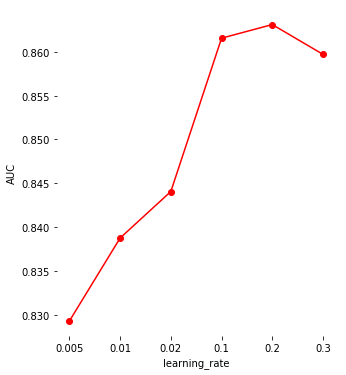

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bynode=1, colsample_bytree=1, gamma=0, learning_rate=0.2,
       max_delta_step=0, max_depth=3, min_child_weight=1, missing=nan,
       n_estimators=100, n_jobs=-1, nthread=None,
       objective='binary:logistic', random_state=4218, reg_alpha=0,
       reg_lambda=1, scale_pos_weight=1, seed=None, silent=None,
       subsample=1, verbosity=1) 0.8631161262044793


In [120]:
grid = {    
    'learning_rate': [0.005, 0.01, 0.02, 0.1, 0.2, 0.3],
    'n_jobs': [-1],
    'random_state': [4218]
}

paramGrid = ParameterGrid(grid)

best_model, best_score, all_models, all_scores = bestFit(XGBClassifier(), paramGrid,
                                                    B_train, a_train, B_val, a_val,
                                                    metric=roc_auc_score, greater_is_better=True, 
                                                    scoreLabel='AUC')

print(best_model, best_score)

-------------FITTING MODELS-------------


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   3 out of  16 | elapsed:   15.2s remaining:  1.1min
[Parallel(n_jobs=-1)]: Done   5 out of  16 | elapsed:   19.9s remaining:   43.9s
[Parallel(n_jobs=-1)]: Done   7 out of  16 | elapsed:   22.3s remaining:   28.6s
[Parallel(n_jobs=-1)]: Done   9 out of  16 | elapsed:   38.5s remaining:   29.9s
[Parallel(n_jobs=-1)]: Done  11 out of  16 | elapsed:   43.5s remaining:   19.7s
[Parallel(n_jobs=-1)]: Done  13 out of  16 | elapsed:  2.1min remaining:   28.8s
[Parallel(n_jobs=-1)]: Done  16 out of  16 | elapsed:  3.6min finished


-------------SCORING MODELS-------------


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  16 out of  16 | elapsed:    0.8s finished


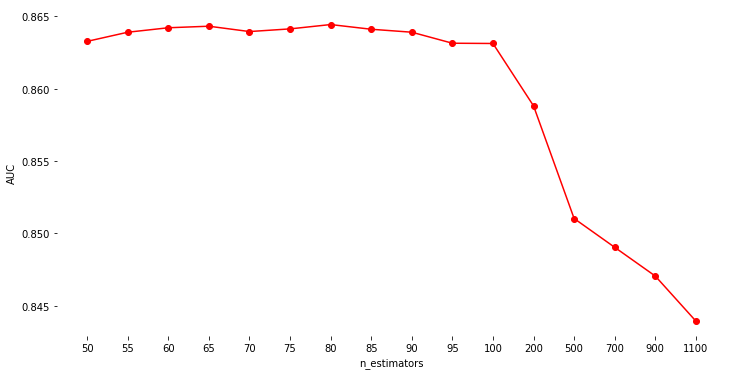

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bynode=1, colsample_bytree=1, gamma=0, learning_rate=0.2,
       max_delta_step=0, max_depth=3, min_child_weight=1, missing=nan,
       n_estimators=80, n_jobs=-1, nthread=None,
       objective='binary:logistic', random_state=4218, reg_alpha=0,
       reg_lambda=1, scale_pos_weight=1, seed=None, silent=None,
       subsample=1, verbosity=1) 0.864423462587575


In [257]:
grid2 = {    
    'n_estimators': [50, 55, 60, 65, 70, 75, 80, 85, 90, 95, 100, 200, 500, 700, 900, 1100],
    'n_jobs': [-1],
    'random_state': [4218]
}

paramGrid = ParameterGrid(grid2)

best_model, best_score, all_models, all_scores = bestFit(XGBClassifier(learning_rate=0.2), paramGrid,
                                                    B_train, a_train, B_val, a_val,
                                                    metric=roc_auc_score, greater_is_better=True, 
                                                    scoreLabel='AUC')

print(best_model, best_score)

-------------FITTING MODELS-------------


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:   18.7s
[Parallel(n_jobs=-1)]: Done   2 out of   7 | elapsed:   38.4s remaining:  1.6min
[Parallel(n_jobs=-1)]: Done   3 out of   7 | elapsed:   47.3s remaining:  1.1min
[Parallel(n_jobs=-1)]: Done   4 out of   7 | elapsed:  1.2min remaining:   54.1s
[Parallel(n_jobs=-1)]: Done   5 out of   7 | elapsed:  1.5min remaining:   35.0s
[Parallel(n_jobs=-1)]: Done   7 out of   7 | elapsed:  1.8min remaining:    0.0s
[Parallel(n_jobs=-1)]: Done   7 out of   7 | elapsed:  1.8min finished


-------------SCORING MODELS-------------


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   7 out of   7 | elapsed:    0.3s finished


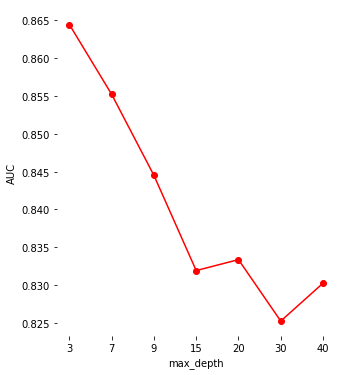

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bynode=1, colsample_bytree=1, gamma=0, learning_rate=0.2,
       max_delta_step=0, max_depth=3, min_child_weight=1, missing=nan,
       n_estimators=80, n_jobs=-1, nthread=None,
       objective='binary:logistic', random_state=4218, reg_alpha=0,
       reg_lambda=1, scale_pos_weight=1, seed=None, silent=None,
       subsample=1, verbosity=1) 0.864423462587575


In [258]:
grid3 = {    
    'max_depth': [3, 7, 9, 15, 20, 30, 40],
    'n_jobs': [-1],
    'random_state': [4218]
}

paramGrid = ParameterGrid(grid3)

best_model, best_score, all_models, all_scores = bestFit(XGBClassifier(learning_rate=0.2, n_estimators=80), paramGrid,
                                                    B_train, a_train, B_val, a_val,
                                                    metric=roc_auc_score, greater_is_better=True, 
                                                    scoreLabel='AUC')

print(best_model, best_score)

-------------FITTING MODELS-------------


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:   14.7s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:   40.0s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done  45 tasks      | elapsed:  5.9min
[Parallel(n_jobs=-1)]: Done  56 tasks      | elapsed:  8.8min
[Parallel(n_jobs=-1)]: Done  70 out of  77 | elapsed: 13.1min remaining:  1.3min
[Parallel(n_jobs=-1)]: Done  77 out of  77 | elapsed: 15.1min finished


-------------SCORING MODELS-------------


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  52 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  62 out of  77 | elapsed:    2.6s remaining:    0.6s
[Parallel(n_jobs=-1)]: Done  77 out of  77 | elapsed:    3.5s finished


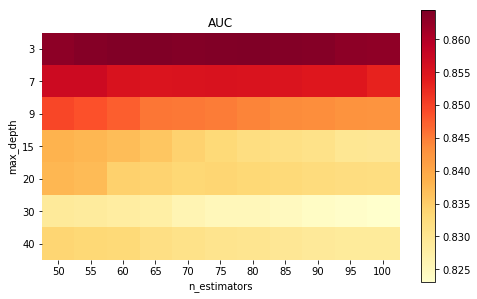

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bynode=1, colsample_bytree=1, gamma=0, learning_rate=0.2,
       max_delta_step=0, max_depth=3, min_child_weight=1, missing=nan,
       n_estimators=80, n_jobs=-1, nthread=None,
       objective='binary:logistic', random_state=4218, reg_alpha=0,
       reg_lambda=1, scale_pos_weight=1, seed=None, silent=None,
       subsample=1, verbosity=1) 0.864423462587575


In [259]:
grid4 = {
    'max_depth': [3, 7, 9, 15, 20, 30, 40],
    'n_estimators': [50, 55, 60, 65, 70, 75, 80, 85, 90, 95, 100],
    'n_jobs': [-1],
    'random_state': [4218]
}

paramGrid = ParameterGrid(grid4)

best_model, best_score, all_models, all_scores = bestFit(XGBClassifier(learning_rate=0.2), paramGrid,
                                                    B_train, a_train, B_val, a_val,
                                                    metric=roc_auc_score, greater_is_better=True, 
                                                    scoreLabel='AUC')

print(best_model, best_score)

-------------FITTING MODELS-------------


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:   12.0s
[Parallel(n_jobs=-1)]: Done   2 out of   7 | elapsed:   13.3s remaining:   33.3s
[Parallel(n_jobs=-1)]: Done   3 out of   7 | elapsed:   14.7s remaining:   19.6s
[Parallel(n_jobs=-1)]: Done   4 out of   7 | elapsed:   15.7s remaining:   11.8s
[Parallel(n_jobs=-1)]: Done   5 out of   7 | elapsed:   18.2s remaining:    7.2s
[Parallel(n_jobs=-1)]: Done   7 out of   7 | elapsed:   19.7s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done   7 out of   7 | elapsed:   19.7s finished


-------------SCORING MODELS-------------


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   7 out of   7 | elapsed:    1.8s finished


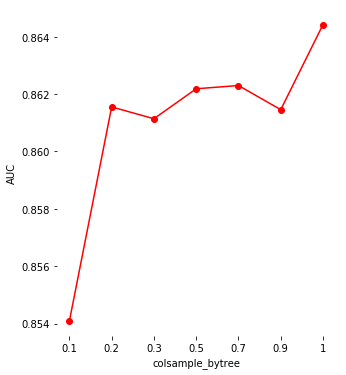

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bynode=1, colsample_bytree=1, gamma=0, learning_rate=0.2,
       max_delta_step=0, max_depth=3, min_child_weight=1, missing=nan,
       n_estimators=80, n_jobs=-1, nthread=None,
       objective='binary:logistic', random_state=4218, reg_alpha=0,
       reg_lambda=1, scale_pos_weight=1, seed=None, silent=None,
       subsample=1, verbosity=1) 0.864423462587575


In [260]:
grid5 = {
    'colsample_bytree': [0.1, 0.2, 0.3, 0.5, 0.7, 0.9, 1],
    'n_jobs': [-1],
    'random_state': [4218]
}

paramGrid = ParameterGrid(grid5)

best_model, best_score, all_models, all_scores = bestFit(XGBClassifier(learning_rate=0.2, n_estimators=80, max_depth=3), paramGrid,
                                                    B_train, a_train, B_val, a_val,
                                                    metric=roc_auc_score, greater_is_better=True, 
                                                    scoreLabel='AUC')

print(best_model, best_score)

-------------FITTING MODELS-------------


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   6 | elapsed:   22.7s remaining:   45.4s
[Parallel(n_jobs=-1)]: Done   3 out of   6 | elapsed:   22.7s remaining:   22.7s
[Parallel(n_jobs=-1)]: Done   4 out of   6 | elapsed:   22.8s remaining:   11.3s
[Parallel(n_jobs=-1)]: Done   6 out of   6 | elapsed:   22.8s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done   6 out of   6 | elapsed:   22.8s finished


-------------SCORING MODELS-------------


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   6 out of   6 | elapsed:    2.4s finished


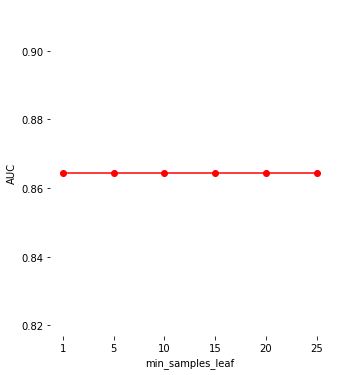

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bynode=1, colsample_bytree=1, gamma=0, learning_rate=0.2,
       max_delta_step=0, max_depth=3, min_child_weight=1,
       min_samples_leaf=1, missing=nan, n_estimators=80, n_jobs=-1,
       nthread=None, objective='binary:logistic', random_state=4218,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
       silent=None, subsample=1, verbosity=1) 0.864423462587575


In [262]:
grid6 = {
    'min_samples_leaf': [1, 5, 10, 15, 20, 25],
    'n_jobs': [-1],
    'random_state': [4218]
}

paramGrid = ParameterGrid(grid6)

best_model, best_score, all_models, all_scores = bestFit(XGBClassifier(learning_rate=0.2, n_estimators=80, max_depth=3, 
                                                                       colsample_bytree=1), paramGrid,
                                                    B_train, a_train, B_val, a_val,
                                                    metric=roc_auc_score, greater_is_better=True, 
                                                    scoreLabel='AUC')

print(best_model, best_score)

-------------FITTING MODELS-------------


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:   28.1s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:   51.8s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:   54.5s
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done  45 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done  56 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done  69 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done  82 out of  88 | elapsed:  4.9min remaining:   21.4s
[Parallel(n_jobs=-1)]: Done  88 out of  88 | elapsed:  5.0min finished


-------------SCORING MODELS-------------


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  52 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done  88 out of  88 | elapsed:    3.9s finished


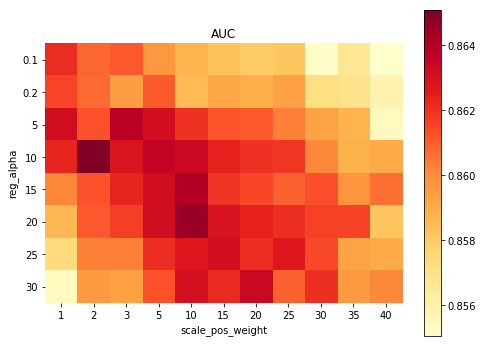

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bynode=1, colsample_bytree=1, gamma=0, learning_rate=0.2,
       max_delta_step=0, max_depth=3, min_child_weight=1,
       min_samples_leaf=1, missing=nan, n_estimators=80, n_jobs=-1,
       nthread=None, objective='binary:logistic', random_state=4218,
       reg_alpha=10, reg_lambda=1, scale_pos_weight=2, seed=None,
       silent=None, subsample=1, verbosity=1) 0.865080231998798


In [264]:

grid7 = {
    'scale_pos_weight': [1, 2, 3, 5, 10, 15, 20, 25, 30, 35, 40],
    'reg_alpha': [0.1, 0.2, 5, 10, 15, 20, 25, 30],
    'n_jobs': [-1],
    'random_state': [4218]
}

paramGrid = ParameterGrid(grid7)

best_model, best_score, all_models, all_scores = bestFit(XGBClassifier(learning_rate=0.2, n_estimators=80, max_depth=3, 
                                                                       colsample_bytree=1, min_samples_leaf=1), paramGrid,
                                                    B_train, a_train, B_val, a_val,
                                                    metric=roc_auc_score, greater_is_better=True, 
                                                    scoreLabel='AUC')

print(best_model, best_score)

-------------FITTING MODELS-------------


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   9 | elapsed:   20.6s remaining:  1.2min
[Parallel(n_jobs=-1)]: Done   3 out of   9 | elapsed:   20.8s remaining:   41.7s
[Parallel(n_jobs=-1)]: Done   4 out of   9 | elapsed:   20.9s remaining:   26.1s
[Parallel(n_jobs=-1)]: Done   5 out of   9 | elapsed:   21.6s remaining:   17.3s
[Parallel(n_jobs=-1)]: Done   6 out of   9 | elapsed:   21.8s remaining:   10.9s
[Parallel(n_jobs=-1)]: Done   7 out of   9 | elapsed:   21.8s remaining:    6.2s
[Parallel(n_jobs=-1)]: Done   9 out of   9 | elapsed:   31.2s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done   9 out of   9 | elapsed:   31.2s finished


-------------SCORING MODELS-------------


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   4 out of   9 | elapsed:    0.3s remaining:    0.4s
[Parallel(n_jobs=-1)]: Done   9 out of   9 | elapsed:    0.6s finished


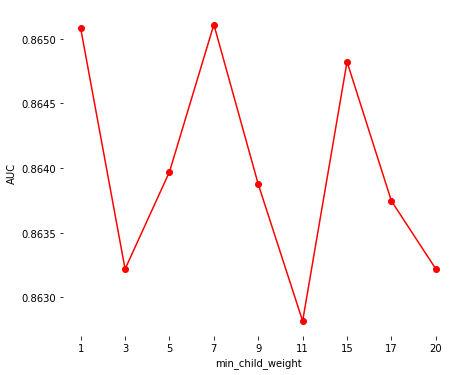

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bynode=1, colsample_bytree=1, gamma=0, learning_rate=0.2,
       max_delta_step=0, max_depth=3, min_child_weight=7,
       min_samples_leaf=1, missing=nan, n_estimators=80, n_jobs=-1,
       nthread=None, objective='binary:logistic', random_state=4218,
       reg_alpha=10, reg_lambda=1, scale_pos_weight=2, seed=None,
       silent=None, subsample=1, verbosity=1) 0.8651103827456406


In [265]:
grid8 = {
    'min_child_weight': [1, 3, 5, 7, 9, 11, 15, 17, 20],
    'n_jobs': [-1],
    'random_state': [4218]
}

paramGrid = ParameterGrid(grid8)

best_model, best_score, all_models, all_scores = bestFit(XGBClassifier(learning_rate=0.2, n_estimators=80, max_depth=3, 
                                                                       colsample_bytree=1, min_samples_leaf=1,
                                                                       scale_pos_weight=2, reg_alpha=10), paramGrid,
                                                    B_train, a_train, B_val, a_val,
                                                    metric=roc_auc_score, greater_is_better=True, 
                                                    scoreLabel='AUC')

print(best_model, best_score)

-------------FITTING MODELS-------------


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   8 | elapsed:   22.2s remaining:  1.1min
[Parallel(n_jobs=-1)]: Done   3 out of   8 | elapsed:   22.4s remaining:   37.4s
[Parallel(n_jobs=-1)]: Done   4 out of   8 | elapsed:   22.6s remaining:   22.6s
[Parallel(n_jobs=-1)]: Done   5 out of   8 | elapsed:   23.1s remaining:   13.8s
[Parallel(n_jobs=-1)]: Done   6 out of   8 | elapsed:   23.5s remaining:    7.8s
[Parallel(n_jobs=-1)]: Done   8 out of   8 | elapsed:   23.6s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done   8 out of   8 | elapsed:   23.6s finished


-------------SCORING MODELS-------------


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   8 | elapsed:    0.2s remaining:    0.9s
[Parallel(n_jobs=-1)]: Done   8 out of   8 | elapsed:    0.5s finished


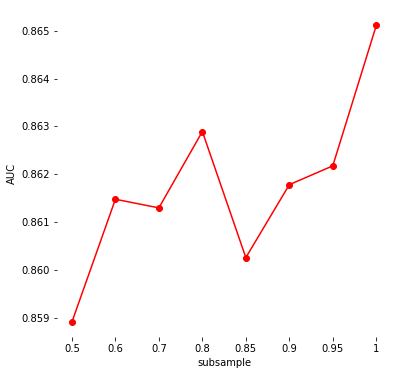

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bynode=1, colsample_bytree=1, gamma=0, learning_rate=0.2,
       max_delta_step=0, max_depth=3, min_child_weight=7,
       min_samples_leaf=1, missing=nan, n_estimators=80, n_jobs=-1,
       nthread=None, objective='binary:logistic', random_state=4218,
       reg_alpha=10, reg_lambda=1, scale_pos_weight=2, seed=None,
       silent=None, subsample=1, verbosity=1) 0.8651103827456406


In [266]:
grid9 = {
    'subsample': [0.5, 0.6, 0.7, 0.8, 0.85, 0.9, 0.95, 1],
    'n_jobs': [-1],
    'random_state': [4218]
}

paramGrid = ParameterGrid(grid9)

best_model, best_score, all_models, all_scores = bestFit(XGBClassifier(learning_rate=0.2, n_estimators=80, max_depth=3, 
                                                                       colsample_bytree=1, min_samples_leaf=1,
                                                                       scale_pos_weight=2, reg_alpha=10, min_child_weight=7), paramGrid,
                                                    B_train, a_train, B_val, a_val,
                                                    metric=roc_auc_score, greater_is_better=True, 
                                                    scoreLabel='AUC')

print(best_model, best_score)

-------------FITTING MODELS-------------


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   8 | elapsed:   30.8s remaining:  1.5min
[Parallel(n_jobs=-1)]: Done   3 out of   8 | elapsed:   31.1s remaining:   52.0s
[Parallel(n_jobs=-1)]: Done   4 out of   8 | elapsed:   31.2s remaining:   31.2s
[Parallel(n_jobs=-1)]: Done   5 out of   8 | elapsed:   31.4s remaining:   18.8s
[Parallel(n_jobs=-1)]: Done   6 out of   8 | elapsed:   31.5s remaining:   10.4s
[Parallel(n_jobs=-1)]: Done   8 out of   8 | elapsed:   31.6s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done   8 out of   8 | elapsed:   31.6s finished


-------------SCORING MODELS-------------


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   8 | elapsed:    0.1s remaining:    0.4s
[Parallel(n_jobs=-1)]: Done   8 out of   8 | elapsed:    0.2s finished


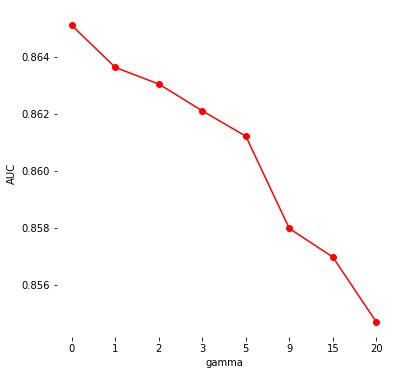

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bynode=1, colsample_bytree=1, gamma=0, learning_rate=0.2,
       max_delta_step=0, max_depth=3, min_child_weight=7,
       min_samples_leaf=5, missing=nan, n_estimators=100, n_jobs=-1,
       nthread=None, objective='binary:logistic', random_state=4218,
       reg_alpha=10, reg_lambda=1, scale_pos_weight=2, seed=None,
       silent=None, subsample=1, verbosity=1) 0.8651152068651354


In [267]:
grid10 = {
    'gamma': [0, 1, 2, 3, 5, 9, 15, 20],
    'n_jobs': [-1],
    'random_state': [4218]
}

paramGrid = ParameterGrid(grid10)

best_model, best_score, all_models, all_scores = bestFit(XGBClassifier(learning_rate=0.2, n_estimators=100, max_depth=3, 
                                                                       colsample_bytree=1, min_samples_leaf=5,
                                                                       scale_pos_weight=2, reg_alpha=10, subsample=1, 
                                                                       min_child_weight=7), paramGrid,
                                                    B_train, a_train, B_val, a_val,
                                                    metric=roc_auc_score, greater_is_better=True, 
                                                    scoreLabel='AUC')

print(best_model, best_score)

In [280]:
#CREATE THE MODEL WITH THE HYPER PARAMETERIZATION EMBEDED IN THE CLASSIFIER FUNCTION
#HOWEVER, EVENTHOUGH WE HAVE BEEN TOLD 80 IS THE BEST FOR THE ESTIMATORS, WE ARE GOING
#TO EVALUATE IF THATS TRUE THROUGH TRUNNING SLIGTHLY OVER THAT NUMBER WITH 101 ESTIMATORS

xg_class = XGBClassifier(objective ='binary:logistic', colsample_bytree = 1, learning_rate = 0.2,
                scale_pos_weight=2, reg_alpha = 10, gamma=0, max_depth = 3, n_estimators=101, 
                random_state=921, min_child_weight=7, subsample = 1) #early_stopping_rounds=50)

In [281]:
#PARAMETER TUNING AND HYPER PARAMETERIZATION CONTINUED... WE ARE TRYING TO EVALUATE AND TWEEK 
#THE PARAMETERS TO SEE WHICH MODEL COMES OUT THE BEST FROM SELECTED PARAMETERS
#THEN WE WILL MOVE THE PARAMETERS TO A Validation AND TEST/TRAIN MODEL AND EVALUATE THE RESULTS FURTHER

eval_set = [(B_val, a_val)]
eval_metric = ["auc","error"]
%time xg_class.fit(B_train, a_train, eval_metric=eval_metric, eval_set=eval_set, verbose=2)

[0]	validation_0-auc:0.820763	validation_0-error:0.068786
[2]	validation_0-auc:0.828343	validation_0-error:0.068786
[4]	validation_0-auc:0.842575	validation_0-error:0.068786
[6]	validation_0-auc:0.845741	validation_0-error:0.068786
[8]	validation_0-auc:0.846213	validation_0-error:0.068786
[10]	validation_0-auc:0.847229	validation_0-error:0.068786
[12]	validation_0-auc:0.849623	validation_0-error:0.068786
[14]	validation_0-auc:0.851746	validation_0-error:0.068786
[16]	validation_0-auc:0.853351	validation_0-error:0.068638
[18]	validation_0-auc:0.854895	validation_0-error:0.068935
[20]	validation_0-auc:0.855972	validation_0-error:0.068935
[22]	validation_0-auc:0.85669	validation_0-error:0.068935
[24]	validation_0-auc:0.857411	validation_0-error:0.068935
[26]	validation_0-auc:0.858422	validation_0-error:0.069678
[28]	validation_0-auc:0.859497	validation_0-error:0.069232
[30]	validation_0-auc:0.861116	validation_0-error:0.068786
[32]	validation_0-auc:0.860827	validation_0-error:0.069232
[34

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bynode=1, colsample_bytree=1, gamma=0, learning_rate=0.2,
       max_delta_step=0, max_depth=3, min_child_weight=7, missing=None,
       n_estimators=101, n_jobs=1, nthread=None,
       objective='binary:logistic', random_state=921, reg_alpha=10,
       reg_lambda=1, scale_pos_weight=2, seed=None, silent=None,
       subsample=1, verbosity=1)

In [282]:
#UPDATE THE MODEL WITH THE BETTER N_ESTIMATORS WITH THE HYPER PARAMETERIZATION EMBEDED IN THE CLASSIFIER FUNCTION 

xg_class = XGBClassifier(objective ='binary:logistic', colsample_bytree = 1, learning_rate = 0.2,
                scale_pos_weight=2, reg_alpha = 10, gamma=0, max_depth = 3, n_estimators=92, 
                random_state=921, min_child_weight=7, subsample = 1) #early_stopping_rounds=50)

In [283]:
#FIT THE MODEL

xg_class.fit(B_train,a_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bynode=1, colsample_bytree=1, gamma=0, learning_rate=0.2,
       max_delta_step=0, max_depth=3, min_child_weight=7, missing=None,
       n_estimators=92, n_jobs=1, nthread=None,
       objective='binary:logistic', random_state=921, reg_alpha=10,
       reg_lambda=1, scale_pos_weight=2, seed=None, silent=None,
       subsample=1, verbosity=1)

In [284]:
#THEN DO THE PREDICTIONS 

preds_train = xg_class.predict(B_train)

In [285]:
preds_val = xg_class.predict(B_val)

In [286]:
predprob_val = xg_class.predict_proba(B_val)[:, 1]

In [287]:
predprob_train = xg_class.predict_proba(B_train)[:, 1]

In [288]:
#ONCE WE RUN OUR PREDICTIONS WE HAVE TO CONVERT OUR PREDICTIONS TO BINARY FORMAT TO BE READ
#THIS CODE WILL MAKE SURE WE ROUND OUR PROBABILITIES THAT COME BY DEFAULT TO SOMETHING READABLE

predictions_train = [round(value) for value in preds_train]

In [289]:
predictions_val = [round(value) for value in preds_val]

In [290]:
#WE WILL LOOK AT THE TRAINING AUC FOR THE MODEL NOW 
#AS WELL BASED ON THE ABOVE CALCULATED VALUES

print ('ROC AUC Score',roc_auc_score(a_train,predprob_train))

ROC AUC Score 0.8794299236426489


In [291]:
#WE WILL LOOK AT THE VALIDATION AUC FOR THE MODEL NOW 
#AS WELL BASED ON THE ABOVE CALCULATED VALUES

print ('ROC AUC Score',roc_auc_score(a_val,predprob_val))

ROC AUC Score 0.8655874537056819


In [313]:
#TO MAKE SURE THE TEST SET IS USED TO LOOK AT FINAL MODEL CHOSEN WHICH IS THE XG BOOST.
#RUN THE PREDICTIONS AND THEN CONVERT TO BINARY FORMAT AGAIN.

preds_test = xg_class.predict(B_test)

In [314]:
predprob_test = xg_class.predict_proba(B_test)[:, 1]

In [315]:
predictions_test = [round(value) for value in preds_test]

In [319]:
#WE WILL LOOK AT THE TEST AUC FOR THE MODEL NOW 
#AS WELL BASED ON THE ABOVE CALCULATED VALUES

print ('ROC AUC Score',roc_auc_score(a_test,predprob_test))

ROC AUC Score 0.862110741282065


In [180]:
#LOOK AT AUC USING A LOGISTIC REGRESSION METHOD, THIS WAS ANOTHER CROSS VALIDATION METHOD 
#LOOKING AT THE TRAINING DATA FIRST, THEN THE VAL DATA

lr = LogisticRegression(solver = 'liblinear', C=1, penalty='l2')
np.mean(cross_val_score(lr,B_train,a_train,cv=10,scoring="roc_auc"))

#eval_set = [(B_val, a_val)]
#eval_metric = ["auc","error"]
#%time LogisticRegression.fit(B_train, a_train, eval_metric=eval_metric, eval_set=eval_set, verbose=10)

0.8070694607017812

In [181]:
#NEXT LOOK AT AUC USING A LOGISTIC REGRESSION METHOD, THIS USED CROSS VALIDATION METHOD 
#BUT THE RESULT CAME OUT LOWER THAN THE PREVIOUS METHOD WITH THE TRAINING DATA WHEN THE VALIDATION SET WAS USED

lr = LogisticRegression(solver = 'liblinear', C=1, penalty='l2')
np.mean(cross_val_score(lr,B_val,a_val,cv=10,scoring="roc_auc"))

#eval_set = [(B_val, a_val)]
#eval_metric = ["auc","error"]
#%time LogisticRegression.fit(B_train, a_train, eval_metric=eval_metric, eval_set=eval_set, verbose=10)

0.7802310596827635

In [292]:
#FEATURE IMPORTANCE BY GAIN SCORE 

#f = 'total_gain'
#modelimp = xg_class.get_booster().get_score(importance_type = f)
#modelimp

xgimp = pd.Series(xg_class.get_booster().get_score(importance_type = f),index=B_val.columns.values).sort_values(ascending=False)
xgimp

PERMVIT        8285.745678
PERNOTMVIT     1032.367173
REL_ROAD_1      540.749621
MAN_COLL_2      516.810540
MAN_COLL_6      288.830843
RELJCT2_1       286.995101
REL_ROAD_4      189.912338
RUR_URB_1       169.561293
DRUNK_DR        146.796239
MAN_COLL_1       99.650105
VE_TOTAL         97.927879
PVH_INVL         80.936173
LGT_COND_2       79.131855
FUNC_SYS_7       46.095653
RUR_URB_2        34.409254
NHS              32.817735
FUNC_SYS_4       31.525215
TYP_INT_1        26.923727
RELJCT2_8        25.925638
DAY_WEEK_6       25.422832
WEATHER_1        24.900975
SP_JUR_3         22.268407
WEATHER_4        21.604728
RD_OWNER_4       18.903971
DAY_WEEK_2       18.796328
RELJCT2_2        18.610740
LGT_COND_1       18.275489
DAY_WEEK_7       17.868496
RD_OWNER_1       17.359315
WEATHER_10       16.449954
                  ...     
TYP_INT_5              NaN
TYP_INT_6              NaN
TYP_INT_7              NaN
TYP_INT_10             NaN
REL_ROAD_2             NaN
REL_ROAD_3             NaN
R

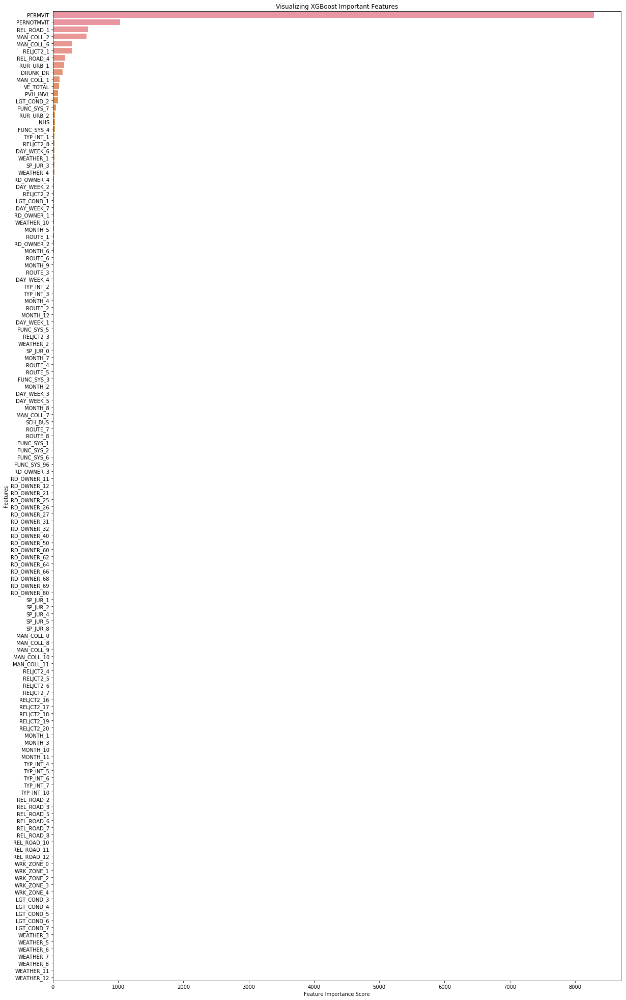

In [293]:
sb.barplot(x=xgimp, y=xgimp.index)
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')
plt.title("Visualizing XGBoost Important Features")
fig = plt.gcf()
fig.set_size_inches(20,35)
plt.show()

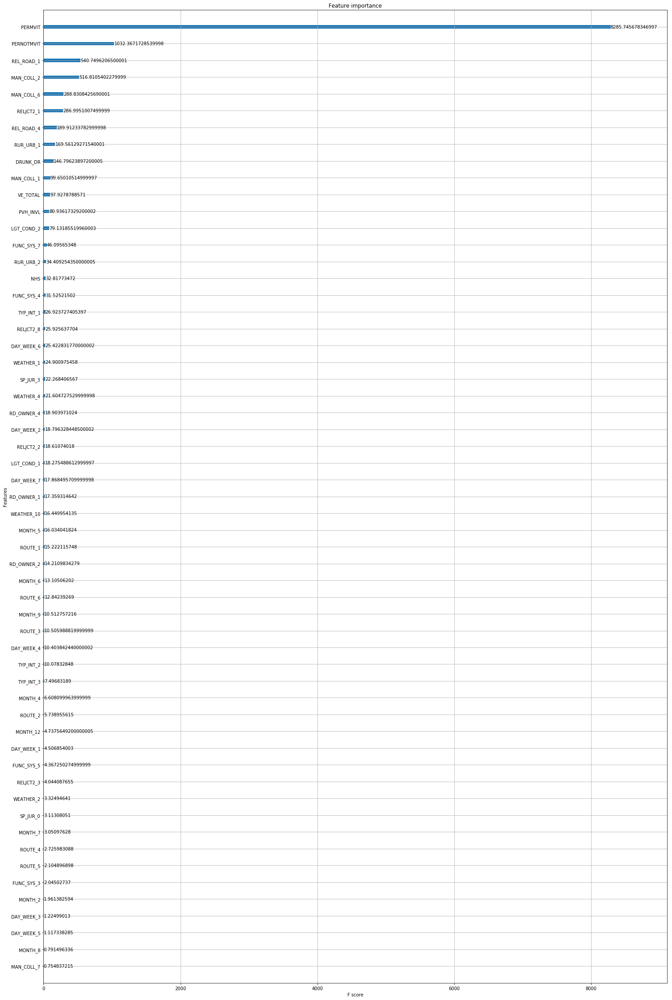

In [294]:
#CREATE THE CHARTS WITH THE DATA LABELS TO THEN EXTRACT THE MOST IMPORTANT VARIABLES
#THIS IS FROM THE XGBOOST PACKAGE TO VISUALIZE THE GRAPH DIFFERENTLY THAN ABOVE
#LOOKING AT THE MATPLOTLIB FEATURE IMPORTANCE CHART
plot_importance(xg_class, importance_type = 'total_gain')
fig = plt.gcf()
fig.set_size_inches(25,40)
fig.savefig('XGB_Model_Feature_Importance.png', dpi=200)
plt.show()


In [ ]:
#NOW THAT WE HAVE THE MOST IMPORTANT FEATURES TO THE OUTCOME OF A MULTIPLE FATALITY CRASH
#WE WILL MAKE SURE WE HAVE THE TOP 10 FROM THE IMPORTANCE CHART ABOVE AND USE THOSE IN THE 
#OVERALL LOGISTIC REGRESSION AT THE END, DEPENDING ON IF THIS MODEL IS BETTER THAN THE
#RANDOM FOREST. THE TOP 10 MOST IMPORTANT FEATURES IN THE XGBOOST MODEL ARE:

#PERMVIT, PERNOTMVIT, MAN_COLL_1, MAN_COLL_2, REL_ROAD_1, MAN_COLL_6, DRUNK_DR, RUR_URB_1, RELJCT2_1 

In [30]:
#NEXT WE WILL USE THE SAME CLEANED DATASET AND TRAININ DATA WE CREATED FOR THE XGBOOST MODEL 
#TO RUN A RANDOM FOREST MODEL AND SEE IF ITS PREDICTIONS ARE BETTER
#WE DO NOT HAVE TO DO ANYTHING EXCEPT FOR PLUG IN OUR DATA SINCE WE CREATED AND CLEANED EVERYTHING 
#FOR THE LAST MODEL. HOWEVER, WE WILL FIRST HYPER TUNE AT A MINIMUM SOME OF THE MORE IMPORTANT
#PARAMETERS SUCH AS N_ESTIMATORS, MAX_DEPTH, AND MAX_FEATURES TO RUN AN EFFICIENT MODEL. 
#THEN WE WILL LOOK FURTHER INTO THE OTHER PARAMETERS.


-------------FITTING MODELS-------------


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   3 out of  10 | elapsed:  1.7min remaining:  3.9min
[Parallel(n_jobs=-1)]: Done   5 out of  10 | elapsed:  2.6min remaining:  2.6min
[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed:  3.0min remaining:  1.3min
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:  5.3min finished


-------------SCORING MODELS-------------


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   6 out of  10 | elapsed:   42.6s remaining:   28.4s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:  3.2min finished


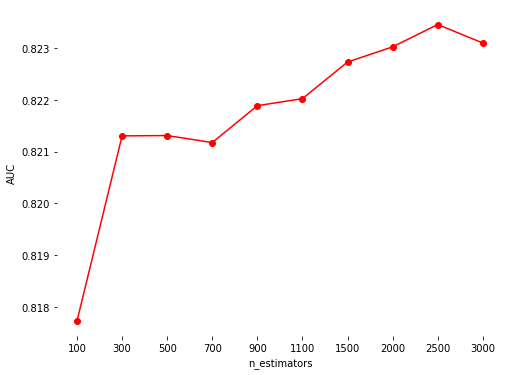

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=2500, n_jobs=-1,
            oob_score=False, random_state=4218, verbose=0,
            warm_start=False) 0.8234572121275607


In [186]:
Rgrid = {    
    'n_estimators': [100, 300, 500, 700, 900, 1100, 1500, 2000, 2500, 3000],
    'n_jobs': [-1],
    'random_state': [4218]
}

paramGrid = ParameterGrid(Rgrid)

best_model, best_score, all_models, all_scores = bestFit(RandomForestClassifier(), paramGrid,
                                                    B_train, a_train, B_val, a_val,
                                                    metric=roc_auc_score, greater_is_better=True, 
                                                    scoreLabel='AUC')

print(best_model, best_score)

-------------FITTING MODELS-------------


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed: 11.7min
[Parallel(n_jobs=-1)]: Done   3 out of  12 | elapsed: 16.6min remaining: 49.7min
[Parallel(n_jobs=-1)]: Done   5 out of  12 | elapsed: 19.8min remaining: 27.7min
[Parallel(n_jobs=-1)]: Done   7 out of  12 | elapsed: 20.2min remaining: 14.5min
[Parallel(n_jobs=-1)]: Done   9 out of  12 | elapsed: 20.7min remaining:  6.9min
[Parallel(n_jobs=-1)]: Done  12 out of  12 | elapsed: 21.7min finished


-------------SCORING MODELS-------------


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 out of  12 | elapsed:  7.3min remaining:  1.5min
[Parallel(n_jobs=-1)]: Done  12 out of  12 | elapsed:  8.3min finished


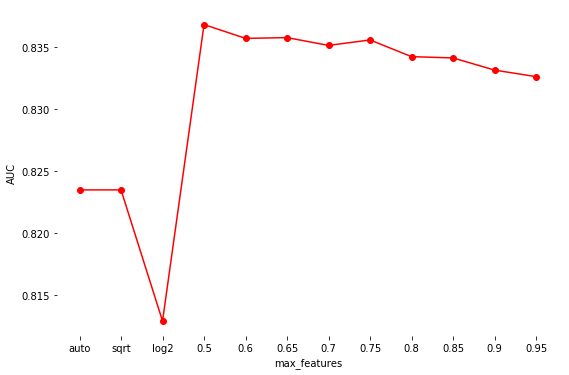

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features=0.5, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=2500, n_jobs=-1,
            oob_score=False, random_state=4218, verbose=0,
            warm_start=False) 0.836816232748604


In [187]:
Rgrid2 = {    
    'max_features': ['auto', 'sqrt', 'log2', 0.5, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95],
    'n_jobs': [-1],
    'random_state': [4218]
}

paramGrid = ParameterGrid(Rgrid2)

best_model, best_score, all_models, all_scores = bestFit(RandomForestClassifier(n_estimators=2500), paramGrid,
                                                    B_train, a_train, B_val, a_val,
                                                    metric=roc_auc_score, greater_is_better=True, 
                                                    scoreLabel='AUC')

print(best_model, best_score)

-------------FITTING MODELS-------------


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   3 out of  14 | elapsed:  9.9min remaining: 36.4min
[Parallel(n_jobs=-1)]: Done   5 out of  14 | elapsed: 17.2min remaining: 30.9min
[Parallel(n_jobs=-1)]: Done   7 out of  14 | elapsed: 19.3min remaining: 19.3min
[Parallel(n_jobs=-1)]: Done   9 out of  14 | elapsed: 19.9min remaining: 11.1min
[Parallel(n_jobs=-1)]: Done  11 out of  14 | elapsed: 20.6min remaining:  5.6min
[Parallel(n_jobs=-1)]: Done  14 out of  14 | elapsed: 21.9min finished


-------------SCORING MODELS-------------


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  14 out of  14 | elapsed: 10.2min remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  14 out of  14 | elapsed: 10.2min finished


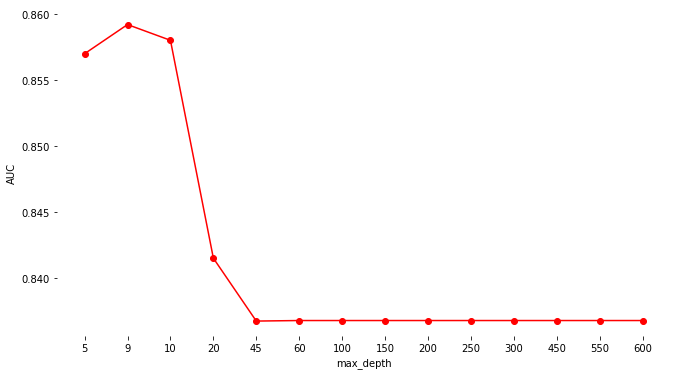

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=9, max_features=0.5, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=2500, n_jobs=-1,
            oob_score=False, random_state=4218, verbose=0,
            warm_start=False) 0.8592020423943622


In [188]:
Rgrid3 = {    
    'max_depth': [5, 9, 10, 20, 45, 60, 100, 150, 200, 250, 300, 450, 550, 600],
    'n_jobs': [-1],
    'random_state': [4218]
}

paramGrid = ParameterGrid(Rgrid3)

best_model, best_score, all_models, all_scores = bestFit(RandomForestClassifier(n_estimators=2500, max_features=0.5), paramGrid,
                                                    B_train, a_train, B_val, a_val,
                                                    metric=roc_auc_score, greater_is_better=True, 
                                                    scoreLabel='AUC')

print(best_model, best_score)

-------------FITTING MODELS-------------


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of  15 | elapsed:  2.3min remaining: 15.1min
[Parallel(n_jobs=-1)]: Done   4 out of  15 | elapsed:  3.0min remaining:  8.1min
[Parallel(n_jobs=-1)]: Done   6 out of  15 | elapsed:  3.2min remaining:  4.8min
[Parallel(n_jobs=-1)]: Done   8 out of  15 | elapsed:  6.1min remaining:  5.3min
[Parallel(n_jobs=-1)]: Done  10 out of  15 | elapsed:  7.4min remaining:  3.7min
[Parallel(n_jobs=-1)]: Done  12 out of  15 | elapsed:  8.1min remaining:  2.0min
[Parallel(n_jobs=-1)]: Done  15 out of  15 | elapsed:  8.2min finished


-------------SCORING MODELS-------------


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  15 out of  15 | elapsed:   37.6s finished


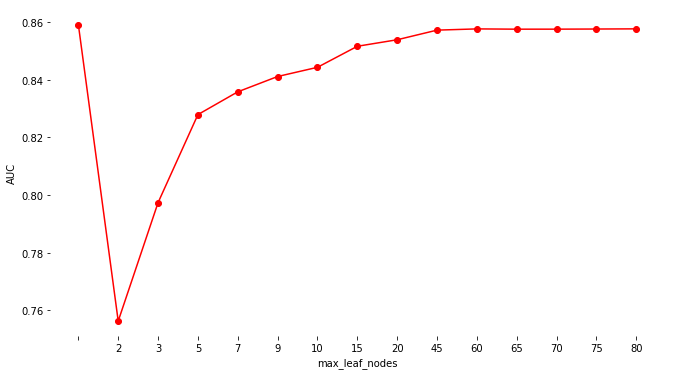

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=9, max_features=0.5, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=2500, n_jobs=-1,
            oob_score=False, random_state=4218, verbose=0,
            warm_start=False) 0.8592020423943622


In [192]:
Rgrid4 = {    
    'max_leaf_nodes': [None, 2, 3, 5, 7, 9, 10, 15, 20, 45, 60, 65, 70, 75, 80],
    'n_jobs': [-1],
    'random_state': [4218]
}

paramGrid = ParameterGrid(Rgrid4)

best_model, best_score, all_models, all_scores = bestFit(RandomForestClassifier(n_estimators=2500, max_features=0.5,
                                                                                max_depth=9), paramGrid,
                                                    B_train, a_train, B_val, a_val,
                                                    metric=roc_auc_score, greater_is_better=True, 
                                                    scoreLabel='AUC')

print(best_model, best_score)

-------------FITTING MODELS-------------


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of  15 | elapsed:  7.4min remaining: 47.9min
[Parallel(n_jobs=-1)]: Done   4 out of  15 | elapsed:  7.4min remaining: 20.4min
[Parallel(n_jobs=-1)]: Done   6 out of  15 | elapsed:  7.5min remaining: 11.2min
[Parallel(n_jobs=-1)]: Done   8 out of  15 | elapsed:  7.5min remaining:  6.6min
[Parallel(n_jobs=-1)]: Done  10 out of  15 | elapsed: 13.3min remaining:  6.6min
[Parallel(n_jobs=-1)]: Done  12 out of  15 | elapsed: 13.3min remaining:  3.3min
[Parallel(n_jobs=-1)]: Done  15 out of  15 | elapsed: 13.4min finished


-------------SCORING MODELS-------------


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  15 out of  15 | elapsed:  1.4min finished


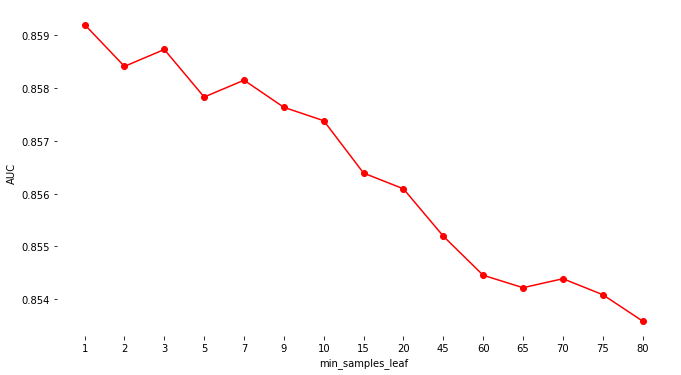

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=9, max_features=0.5, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=2500, n_jobs=-1,
            oob_score=False, random_state=4218, verbose=0,
            warm_start=False) 0.8592020423943622


In [195]:
Rgrid5 = {    
    'min_samples_leaf': [1, 2, 3, 5, 7, 9, 10, 15, 20, 45, 60, 65, 70, 75, 80],
    'n_jobs': [-1],
    'random_state': [4218]
}

paramGrid = ParameterGrid(Rgrid5)

best_model, best_score, all_models, all_scores = bestFit(RandomForestClassifier(n_estimators=2500, max_features=0.5,
                                                                                max_depth=9, max_leaf_nodes=None), paramGrid,
                                                    B_train, a_train, B_val, a_val,
                                                    metric=roc_auc_score, greater_is_better=True, 
                                                    scoreLabel='AUC')

print(best_model, best_score)

In [196]:
#NEXT WE WILL USE THE BEST PARAMETERS WE JUST FOUND TO GET THE BEST RF MODEL 

rfc = RandomForestClassifier(n_estimators=2500, max_features=0.5, max_depth=9,n_jobs=-1, min_samples_split=2,
                             min_samples_leaf=1, max_leaf_nodes=None, random_state=4209)
rfc.fit(B_train,a_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=9, max_features=0.5, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=2500, n_jobs=-1,
            oob_score=False, random_state=4209, verbose=0,
            warm_start=False)

In [213]:
#NEXT THE PREDICTIONS FOR THE CONFUSION MATRIX

rf_a_pred=rfc.predict(B_val)

In [214]:
#NEXT THE PREDICTIONS FOR THE train set

rf_B_pred=rfc.predict(B_train)

In [208]:
#NEXT THE PREDICTED PROBABILITIES FOR THE AUC

rf_predprob_val = rfc.predict_proba(B_val)[:, 1]

In [209]:
#NEXT THE PREDICTED PROBABILITIES FOR THE AUC of the train set

rf_predprob_train = rfc.predict_proba(B_train)[:, 1]

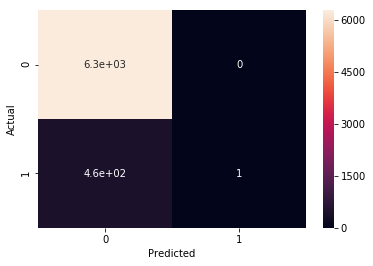

In [199]:
#NEXT WE WILL DRAW THE CONFUSION MATRIX FOR THE OUTCOMES

confusion_matrix = pd.crosstab(a_val, rf_a_pred, rownames=['Actual'], colnames=['Predicted'])
sb.heatmap(confusion_matrix, annot=True)

In [215]:
#WE WILL ALSO LOOK AT THE AUC TO COMPARE THE MODELS SINCE LIKE BEFORE OUR 
#DISTRIBUTION IS HIGHLY SKEWED AND WILL EFFECT ACCURACY OF THE MODEL

print ('ROC AUC Score',roc_auc_score(a_val,rf_predprob_val))

ROC AUC Score 0.8591734422573571


In [216]:
#WE WILL ALSO LOOK AT THE AUC TO COMPARE THE MODELS SINCE LIKE BEFORE OUR 
#DISTRIBUTION IS HIGHLY SKEWED AND WILL EFFECT ACCURACY OF THE MODEL

print ('ROC AUC Score',roc_auc_score(a_train,rf_predprob_train))

ROC AUC Score 0.9364139404101706


In [203]:
#NEXT LET LOOK AT THE FEATURE IMPORTANCE SELECTIONS OF THE RF BY CREATING A FEATURE IMPORTANCE MODEL

rfc_feature_imp = pd.Series(rfc.feature_importances_,index=B_val.columns.values).sort_values(ascending=False)
rfc_feature_imp

PERMVIT        0.299269
PERNOTMVIT     0.050245
MAN_COLL_2     0.043308
VE_TOTAL       0.034900
DRUNK_DR       0.023892
REL_ROAD_1     0.022166
RELJCT2_1      0.017717
MAN_COLL_0     0.016443
LGT_COND_2     0.014600
RUR_URB_1      0.014491
REL_ROAD_4     0.013361
LGT_COND_1     0.011933
RUR_URB_2      0.011261
FUNC_SYS_4     0.011138
MAN_COLL_6     0.010968
DAY_WEEK_1     0.010861
PVH_INVL       0.010119
ROUTE_2        0.010028
DAY_WEEK_7     0.009978
NHS            0.009367
WEATHER_1      0.008762
DAY_WEEK_6     0.008720
RD_OWNER_1     0.008512
MONTH_6        0.008498
MONTH_12       0.008472
MONTH_4        0.008419
SP_JUR_3       0.008404
ROUTE_3        0.008374
DAY_WEEK_4     0.008153
ROUTE_1        0.007941
                 ...   
SP_JUR_4       0.000561
WEATHER_11     0.000389
RD_OWNER_50    0.000283
RD_OWNER_64    0.000217
MAN_COLL_9     0.000129
REL_ROAD_10    0.000124
RELJCT2_4      0.000088
SP_JUR_8       0.000025
REL_ROAD_7     0.000016
RD_OWNER_60    0.000015
RD_OWNER_21    0

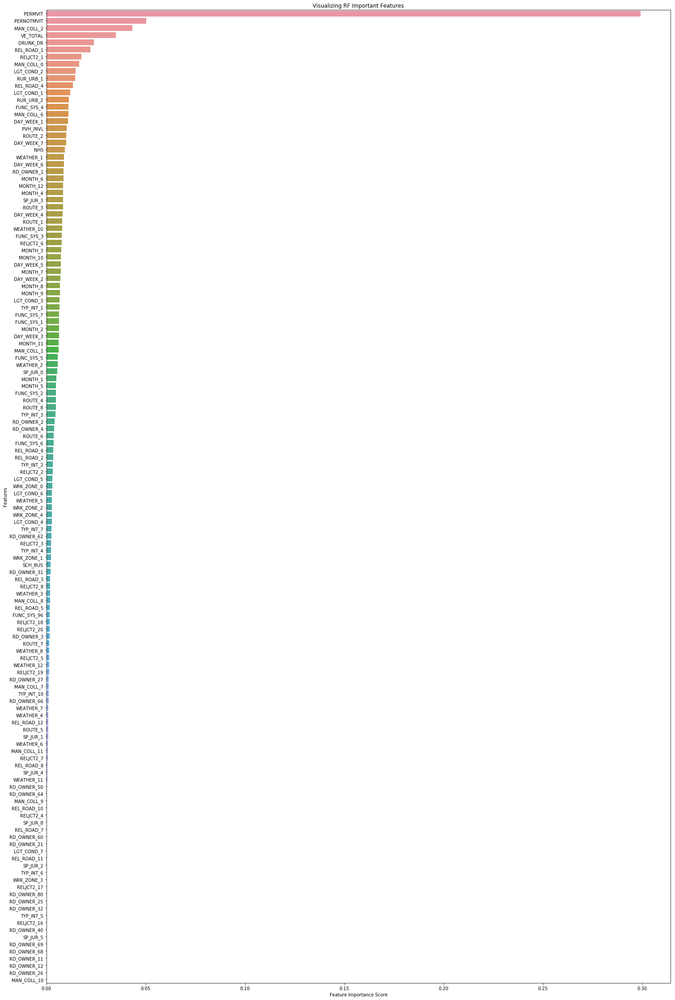

In [204]:
#NEXT LETS VISUALIZE OUR FEATURE IMPORTANCE AS WE DID ABOVE

sb.barplot(x=rfc_feature_imp, y=rfc_feature_imp.index)
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')
plt.title("Visualizing RF Important Features")
fig = plt.gcf()
fig.set_size_inches(25,40)
plt.show()

In [ ]:
#WHILE THE TOP TEN OF THE RF ALGORITHM IS VERY RELEVANT IT IS VERY
#DIFFERENT FROM THE FEATURES CHOSEN BY XGBOOST DUE TO THE GINI METHOD 
#BEING USED TO INTERPRET THE RANDOM FOREST RESULTS
#THE TOP 10 MOST IMPORTANCE FEATURES ARE AS FOLLOWS:

#PERMVIT, PERNOTMVIT, MAN_COLL_2, REL_ROAD_1, MAN_COLL_6, DRUNK_DR, RELJCT2_1, REL_ROAD_4, RUR_URB_1, MAN_COLL_1

#WHILE THESE ARE INTERESTING RESULTS WITH ALMOST EQUAL ACCURACY, 
#WE WILL USE THE RESULTS FROM THE XGBOOST MODEL DUE TO IT HAVING THE 
#SLIGHTLY HIGHER AUC. 

# XGBOOST AUC = VALIDATION SET SCORE 87% (86.55%)

# VS. 

# RANDOM FOREST MODEL = VALIDATION SET SCORE/CONFUSION MATRIX 86% (85.92%)

#WE ARE CHOOSING AUC IN THIS MODEL OVER ACCURACY AS THE INFORMATIVE 
#METRIC DUE TO THE VERY LARGE SKEW OF THE OUTCOME DATA BEING 
#OVERWHELMINGLY A NON-MULTIPLE FATALITY CRASH.

#THE HIGH ACCURACIES ARE POSSIBLY ACHEIVEABLE DUE TO CHANCE AND 
#JUST PICKING THE OUTCOME AT WILL, SO USING AUC HELPS TO MITIGATE THE
#SKEW AND IMPORVE SELECTION OF THE BEST MODEL THAT GETS THE PREDICTIONS
#CORRECT.

#THIS MEANS WE WILL CHOOSE THE XGBOOST MODEL SINCE IT PERFOMED BETTER AND 
#CONFIRM WITH THE TEST SET WE CREATED. tHE RESULTS TO THE TEST SET WERE SIMILAR

#XGBOOST AUC = TEST SET SCORE 86% (86.21%)

#NEXT WE WILL RUN THE OVERALL LOGISTIC REGRESSION WITH THE TOP 10 RESULTS
#FROM THE XGBOOST MODEL TO DETERMINE IMPACTS OF THE IDENTIFIED 
#IMPORTANT FEATURES OF THE BETTER MODEL.

In [295]:
#CREATE THE LOGISTIC REGRESSION WITH STATSMODELS AND THEN INTERPRET RESULTS 

#WE WILL CREATE A SMALLER DATASET WITH ONLY THE MOST IMPORTANT FEATURES FROM
#THE XGBOOST MODEL AND THE LABEL/DEPENDENT VARAIBLE FOR THE MODEL. 
#THIS WILL MAKE THE MODEL RUN MORE EFFICIENTLY.

#ONCE THE TWO SETS ARE CREATED WE CAN RUN THE MODEL
#INITIALLY WE WANT TO RUN A MODEL WITH JUST THE INTERCEPT 
#THIS WAY WE CAN SEE THE IMPROVEMENT TO THE MODEL OUR TOP 10 FEATURES ADD 
#OR SUBTRACT FROM THE BASE MODEL

endo = a
exo = sm.add_constant(accidentX.loc[:,['PERMVIT','PERNOTMVIT','MAN_COLL_2',
         'REL_ROAD_1','MAN_COLL_6','DRUNK_DR', 'RELJCT2_1', 'REL_ROAD_4', 'RUR_URB_1', 'MAN_COLL_1']])

LRFXG = sm.Logit(endo, exo['const'])

resultsXG = LRFXG.fit()

Optimization terminated successfully.
         Current function value: 0.255879
         Iterations 7


In [296]:
#HERE WE HAVE THE RESULTS OF THE BASE MODEL THAT WE CREATED. WE WILL 
#NOW BE ABLE TO BUILD ON IT TO SEE WHAT OUR SELECTED FEATURES ADD OR TAKE AWAY

print (resultsXG.summary2())

                         Results: Logit
Model:              Logit            Pseudo R-squared: 0.000     
Dependent Variable: MultiFatal       AIC:              17224.7081
Date:               2020-04-28 12:12 BIC:              17233.1320
No. Observations:   33654            Log-Likelihood:   -8611.4   
Df Model:           0                LL-Null:          -8611.4   
Df Residuals:       33653            LLR p-value:      nan       
Converged:          1.0000           Scale:            1.0000    
No. Iterations:     7.0000                                       
-------------------------------------------------------------------
         Coef.    Std.Err.       z       P>|z|     [0.025    0.975]
-------------------------------------------------------------------
const   -2.5734     0.0212   -121.1420   0.0000   -2.6151   -2.5318



In [297]:
#NEXT WE WILL RUN THE MODEL WITH THE INTERCEPT AND ALL 10 OF 
#OUR MOST IMPORTANT FEATURES THAT WERE SELECTED BY OUR XGB MODEL

LRFXG2 = sm.Logit(endo, exo)

resultsXG2 = LRFXG2.fit()

Optimization terminated successfully.
         Current function value: 0.222337
         Iterations 8


In [298]:
#NEXT WE NEED TO READ/INTERPRET THE RESULTS FROM OUR MODEL

#WE DID GET A SIGNIFICANTLY LOWER AIC AND BIC THIS MEANS OUR
#FULL MODEL IS BETTER THAN THE BASE MODEL

print (resultsXG2.summary2())

                         Results: Logit
Model:              Logit            Pseudo R-squared: 0.131     
Dependent Variable: MultiFatal       AIC:              14987.0648
Date:               2020-04-28 12:12 BIC:              15079.7276
No. Observations:   33654            Log-Likelihood:   -7482.5   
Df Model:           10               LL-Null:          -8611.4   
Df Residuals:       33643            LLR p-value:      0.0000    
Converged:          1.0000           Scale:            1.0000    
No. Iterations:     8.0000                                       
------------------------------------------------------------------
              Coef.   Std.Err.     z      P>|z|    [0.025   0.975]
------------------------------------------------------------------
const        -4.4154    0.1053  -41.9269  0.0000  -4.6218  -4.2090
PERMVIT       0.3721    0.0114   32.6118  0.0000   0.3497   0.3945
PERNOTMVIT    0.3513    0.0492    7.1437  0.0000   0.2549   0.4477
MAN_COLL_2    1.5983    0.0833

In [310]:
#SINCE WE SEE THAT REL_ROAD_4 IS NOT SIGNIFICANT WE WILL TRY TO TAKE IT OUT TO EVALUATE THE EFFECT ON THE MODEL

exo2 = sm.add_constant(accidentX.loc[:,['PERMVIT','PERNOTMVIT','MAN_COLL_2',
         'REL_ROAD_1','MAN_COLL_6','DRUNK_DR', 'RELJCT2_1', 'RUR_URB_1',  'MAN_COLL_1']])

logit = sm.Logit(endog, exo2)

resultsXG3 = logit.fit()

Optimization terminated successfully.
         Current function value: 0.222354
         Iterations 8


In [311]:
#NEXT WE NEED TO READ/INTERPRET THE NEW RESULTS 

#WE CAN SEE THAT WE HAVE A SLIGHTLY BETTER MODEL BASED ON THE BIC 
#HOWEVER THE LOG-LIKELIHOOD AND AIC STAYED THE SAME, THIS MEANS
#THE MODEL IS NOT EXACTLY BETTER OVERALL BUT IT IS IF WE ARE 
#SEARCHING FOR A BETTER BIC.
#IN THIS CASE WE WILL STAY WITH TH BIC BECAUSE A FALSE POSITIVE
#(A MULTIPLE FATALITY CRASH) IS AS OR MORE MISLEADING AS A NON-FATAL
#CRASH INVOLVING MULTIPLE FATALITIES


print (resultsXG2.summary2())

                         Results: Logit
Model:              Logit            Pseudo R-squared: 0.131     
Dependent Variable: MultiFatal       AIC:              14986.2132
Date:               2020-04-28 12:21 BIC:              15070.4520
No. Observations:   33654            Log-Likelihood:   -7483.1   
Df Model:           9                LL-Null:          -8611.4   
Df Residuals:       33644            LLR p-value:      0.0000    
Converged:          1.0000           Scale:            1.0000    
No. Iterations:     8.0000                                       
------------------------------------------------------------------
              Coef.   Std.Err.     z      P>|z|    [0.025   0.975]
------------------------------------------------------------------
const        -4.3420    0.0788  -55.0815  0.0000  -4.4965  -4.1875
PERMVIT       0.3711    0.0114   32.6629  0.0000   0.3488   0.3933
PERNOTMVIT    0.3430    0.0485    7.0718  0.0000   0.2479   0.4380
MAN_COLL_2    1.5882    0.0826

In [312]:
#NEXT WE CONVERT THE NEW FINAL RESULTS TO ODDS RATIOS FOR BETTER INTERPRETATION
#WE CAN SEE THAT WE GET BETTER RESULTS WITH ALL FEATURES NOW BEING
#STATISTICALLY SIGNIFICANT
#GETTING THE ODDS RATIOS, Z-VALUE, AND 95% CI

model_odds = pd.DataFrame(np.exp(resultsXG3.params), columns= ['OR'])
model_odds['p-value']= resultsXG3.pvalues
model_odds[['2.5%', '97.5%']] = np.exp(resultsXG3.conf_int())
model_odds

,OR,p-value,2.5%,97.5%
const,0.013011,0.000000e+00,0.011148,0.015184
PERMVIT,1.449261,5.253371e-234,1.417349,1.481891
PERNOTMVIT,1.409121,1.529011e-12,1.281348,1.549635
MAN_COLL_2,4.894811,2.394392e-82,4.163029,5.755226
REL_ROAD_1,0.465739,2.363369e-22,0.399263,0.543283
MAN_COLL_6,3.342716,2.370714e-42,2.810483,3.975741
DRUNK_DR,1.492987,3.555539e-19,1.367538,1.629944
RELJCT2_1,1.552299,1.604473e-12,1.374030,1.753696
RUR_URB_1,1.436427,1.601415e-14,1.309603,1.575532
MAN_COLL_1,1.428875,1.059835e-03,1.154016,1.769199
